# Introduction to Deep Learning with Keras

In [1]:
import time
start_time = time.time()

In [2]:
data_folder = "C:/Users/Admin/Dropbox/Python/ficheiros/DataCamp/DataCamp - Introduction to Deep Learning with Keras/"

In [3]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [4]:
# CHAPTER 1 - Introducing Keras
import keras
from keras.models import Sequential
from keras.layers import Dense

# CHAPTER 2 - Going Deeper
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping, ModelCheckpoint

# CHAPTER 3 - Improving Your Model Performance
from keras.layers import BatchNormalization
from sklearn.preprocessing import LabelEncoder
from keras.optimizers import Adam
from sklearn.model_selection import RandomizedSearchCV, cross_val_score, KFold
from keras.wrappers.scikit_learn import KerasClassifier

# CHAPTER 4 - Advanced Model Architectures
import keras.backend as K
from keras.layers import Dense, Conv2D, Flatten
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input
from keras.applications.resnet50 import ResNet50, decode_predictions
from keras.engine.training import Model
from keras.preprocessing.text import Tokenizer
from keras.layers import Dense, LSTM, Embedding


Using TensorFlow backend.


In [5]:
%%time
from pdf2image import convert_from_path

poppler_path = 'C:/Users/Admin/poppler-0.68.0/bin'

# pdf with the course material
pdf_1 = convert_from_path(data_folder +"chapter1.pdf", 50, poppler_path=poppler_path)
pdf_2 = convert_from_path(data_folder +"chapter2.pdf", 50, poppler_path=poppler_path)
pdf_3 = convert_from_path(data_folder +"chapter3.pdf", 50, poppler_path=poppler_path)
pdf_4 = convert_from_path(data_folder +"chapter4.pdf", 50, poppler_path=poppler_path)

Wall time: 11.9 s


In [6]:
# plot 1 image
def plot_pdf_1(pdf, page, left=0, bottom=0, right=1, top=1, wspace=0, hspace=0):
    plt.axis('off'); plt.imshow(pdf[page])
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()

# plot 2 images horizontally
def plot_pdf_2(pdf, page1, page2, left=0, bottom=0, right=2.2, top=1, wspace=0, hspace=0.05, format_img=".jpg"):
    plt.subplot(1, 2, 1); plt.axis('off'); plt.imshow(pdf[page1])
    plt.subplot(1, 2, 2); plt.axis('off'); plt.imshow(pdf[page2])
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()

# plot 3 images horizontally
def plot_pdf_3(pdf, page1, page2, page3, left=0, bottom=-1, right=2.7, top=1, wspace=0, hspace=0.1, format_img=".jpg"):
    plt.subplot(1, 3, 1); plt.axis('off'); plt.imshow(pdf[page1]); 
    plt.subplot(1, 3, 2); plt.axis('off'); plt.imshow(pdf[page2])
    plt.subplot(1, 3, 3); plt.axis('off'); plt.imshow(pdf[page3])
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()
    
# plot 4 images horizontally
def plot_pdf_4(pdf, page1,page2,page3,page4, left=0, bottom=-1, right=2.7, top=1, wspace=0, hspace=0.1, format_img=".jpg"):
    plt.subplot(1, 4, 1); plt.axis('off'); plt.imshow(pdf[page1])
    plt.subplot(1, 4, 2); plt.axis('off'); plt.imshow(pdf[page2])
    plt.subplot(1, 4, 3); plt.axis('off'); plt.imshow(pdf[page3])
    plt.subplot(1, 4, 4); plt.axis('off'); plt.imshow(pdf[page4])    
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()

In [7]:
# plot 1 image
def plot_1(image1, left=0, bottom=0, right=1, top=1, wspace=0, hspace=0, format_img=".jpg"):
    image = plt.imread(data_folder + (image1+format_img)); plt.axis('off'); plt.imshow(image)
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()

# plot 2 images horizontally
def plot_2(image1, image2, left=0, bottom=0, right=2.2, top=1, wspace=0, hspace=0.05, format_img=".jpg"):
    plt.subplot(1, 2, 1); image = plt.imread(data_folder + (image1+format_img)); plt.axis('off'); plt.imshow(image)
    plt.subplot(1, 2, 2); image = plt.imread(data_folder + (image2+format_img)); plt.axis('off'); plt.imshow(image)
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()

# plot 3 images horizontally
def plot_3(image1, image2, image3, left=0, bottom=-1, right=2.7, top=1, wspace=0, hspace=0.1, format_img=".jpg"):
    plt.subplot(1, 3, 1); imagem = plt.imread(data_folder + (image1+format_img)); plt.axis('off'); plt.imshow(imagem); 
    plt.subplot(1, 3, 2); imagem = plt.imread(data_folder + (image2+format_img)); plt.axis('off'); plt.imshow(imagem)
    plt.subplot(1, 3, 3); imagem = plt.imread(data_folder + (image3+format_img)); plt.axis('off'); plt.imshow(imagem)
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()
    
# plot 4 images horizontally
def plot_4(image1, image2, image3, image4, left=0, bottom=-1, right=2.7, top=1, wspace=0, hspace=0.1, format_img=".jpg"):
    plt.subplot(1, 4, 1); imagem = plt.imread(data_folder + (image1+format_img)); plt.axis('off'); plt.imshow(imagem)
    plt.subplot(1, 4, 2); imagem = plt.imread(data_folder + (image2+format_img)); plt.axis('off'); plt.imshow(imagem)
    plt.subplot(1, 4, 3); imagem = plt.imread(data_folder + (image3+format_img)); plt.axis('off'); plt.imshow(imagem)
    plt.subplot(1, 4, 4); imagem = plt.imread(data_folder + (image4+format_img)); plt.axis('off'); plt.imshow(imagem)    
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()

##   CHAPTER 1 - Introducing Keras

In this first chapter, you will get introduced to neural networks, understand what kind of problems they can solve, and when to use them. You will also build several networks and save the earth by training a regression model that approximates the orbit of a meteor that is approaching us.

#### Exercício 1 - What is Keras?

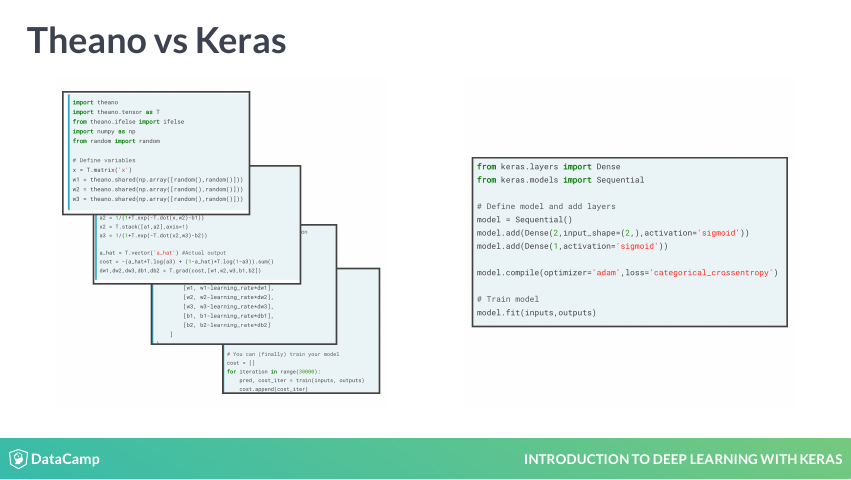

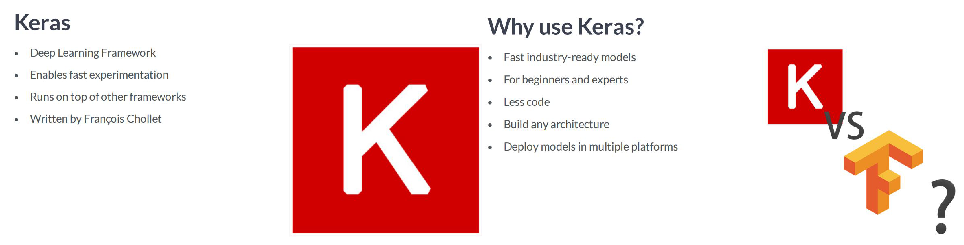

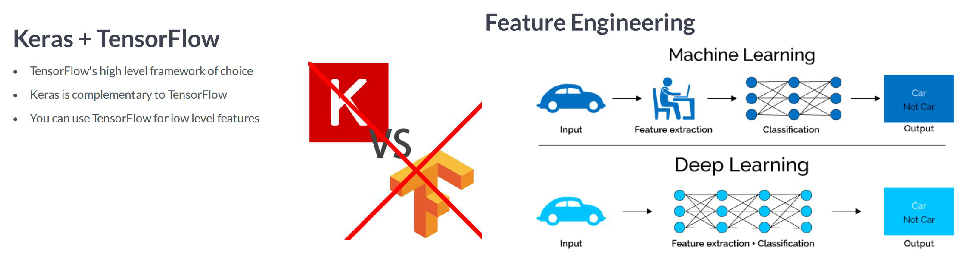

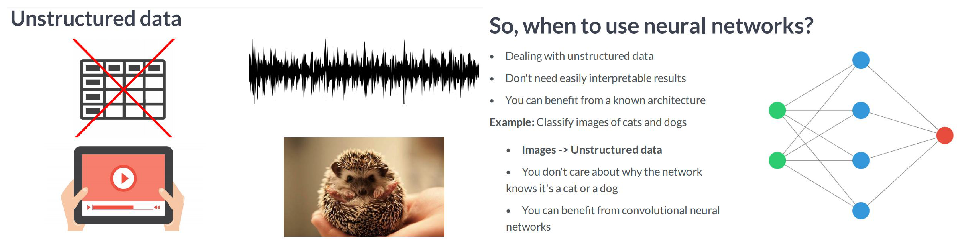

In [8]:
#vídeo
display(pdf_1[1]); plot_2('keras', 'keras2'); plot_2('keras_tf', 'fe'); print("="*120); plot_2('un_data', 'so')

Exercício 2

In [9]:
# Describing Keras

# Which of the following statements about Keras is false?

# Keras can work well on its own without using a backend, like TensorFlow. ---> False ---> answer
print("""True: Keras is a wrapper around a backend, so a backend like TensorFlow, Theano, CNTK, etc must be provided.""")

True: Keras is a wrapper around a backend, so a backend like TensorFlow, Theano, CNTK, etc must be provided.


Exercício 3

In [10]:
# Would you use deep learning?

# Imagine you're building an app that allows you to take a picture of your clothes and then shows you a pair of shoes that
# would match well. This app needs a machine learning module that's in charge of identifying the type of clothes you are
# wearing, as well as their color and texture. Would you use deep learning to accomplish this task?

print("I'd use deep learning since we are dealing with unstructured data and neural networks work well with images.")

I'd use deep learning since we are dealing with unstructured data and neural networks work well with images.


#### Exercício 4 - Your first neural network

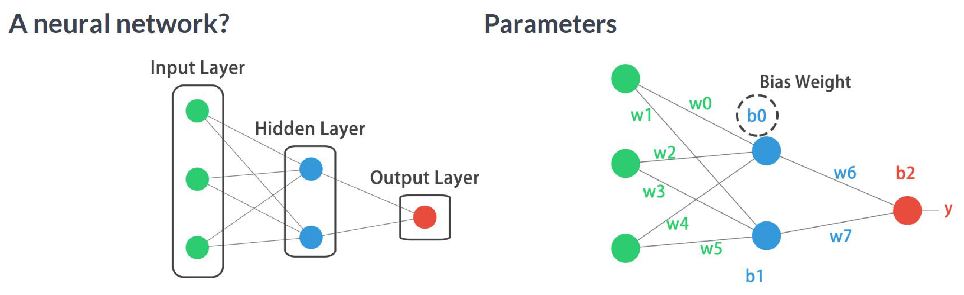

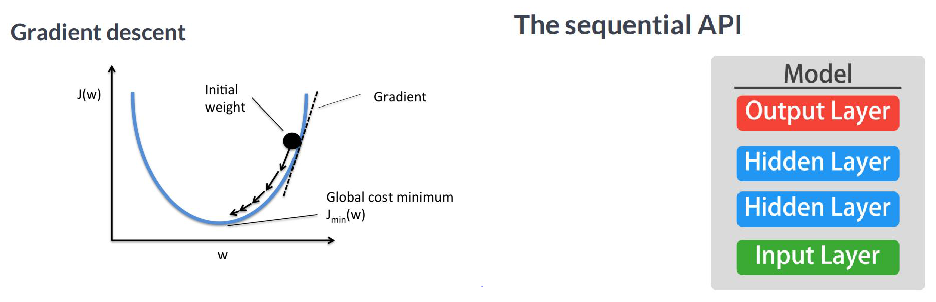

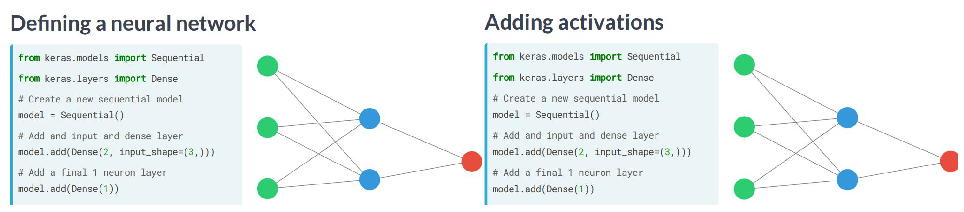

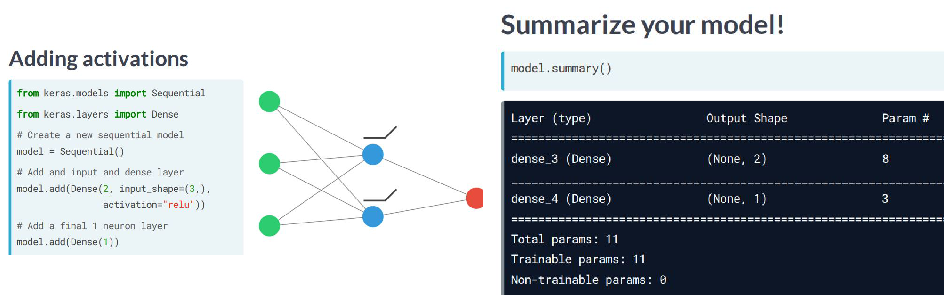

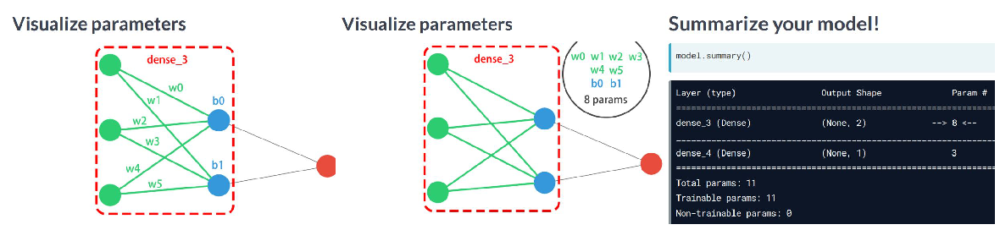

In [11]:
#vídeo
plot_2('nn', 'parameters'); print("="*120); plot_2('gd', 'api'); print("="*120); plot_2('define_nn', 'add_act');
plot_2('add_act2', 'sum');  print("="*120); plot_3('param0', 'param', 'sum2')

Exercício 5

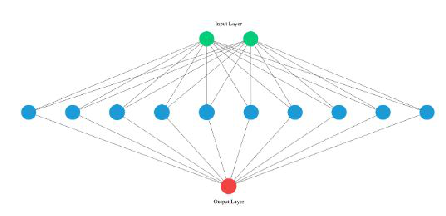

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 10)                30        
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 11        
Total params: 41
Trainable params: 41
Non-trainable params: 0
_________________________________________________________________


In [12]:
# Hello nets!

# You will build a network that takes two numbers as input, passes them through a hidden layer of 10 neurons, and finally 
# outputs a single non-constrained number.

plot_1('ex_5')

#############################

# Import the Sequential model and Dense layer
from keras.models import Sequential
from keras.layers import Dense

# Create a Sequential model
model = Sequential()

# Add an input layer and a hidden layer with 10 neurons
model.add(Dense(10, input_shape=(2,), activation="relu"))

# Add a 1-neuron output layer
model.add(Dense(1))

# Summarise your model
model.summary()


Exercício 6

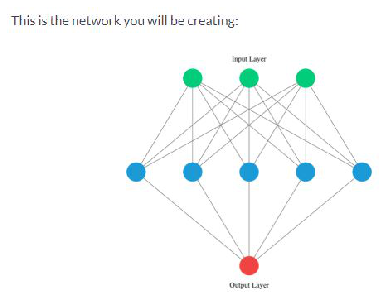

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 5)                 20        
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 6         
Total params: 26
Trainable params: 26
Non-trainable params: 0
_________________________________________________________________


In [13]:
# Counting parameters

# You've just created a neural network. Create a new one now and take some time to think about the weights of each layer. 

plot_1('ex_6')

# Instantiate a new Sequential model
model = Sequential()

# Add a Dense layer with five neurons and three inputs
model.add(Dense(5, input_shape=(3,), activation="relu"))

# Add a final Dense layer with one neuron and no activation
model.add(Dense(1))

# Summarize your model
model.summary()

In [14]:
# Question
# Given the model you just built, which answer is correct regarding the number of weights (parameters) in the hidden layer?

print("""There are 20 parameters, 15 from the connection of our input layer to our hidden layer and 5 from the bias weight
of each neuron in the hidden layer.""")

There are 20 parameters, 15 from the connection of our input layer to our hidden layer and 5 from the bias weight
of each neuron in the hidden layer.


Exercício 7

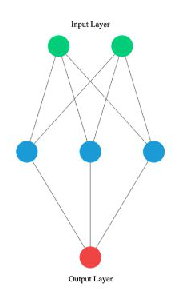

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 3)                 9         
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 4         
Total params: 13
Trainable params: 13
Non-trainable params: 0
_________________________________________________________________


In [15]:
# Build as shown!

# Build this
plot_1('ex_7')

from keras.models import Sequential
from keras.layers import Dense

# Instantiate a Sequential model
model = Sequential()

# Build the input and hidden layer
model.add(Dense(3, input_shape=(2,), activation='relu'))

# Add the ouput layer
model.add(Dense(1))
model.summary()

#### Exercício 8 - Surviving a meteor strike

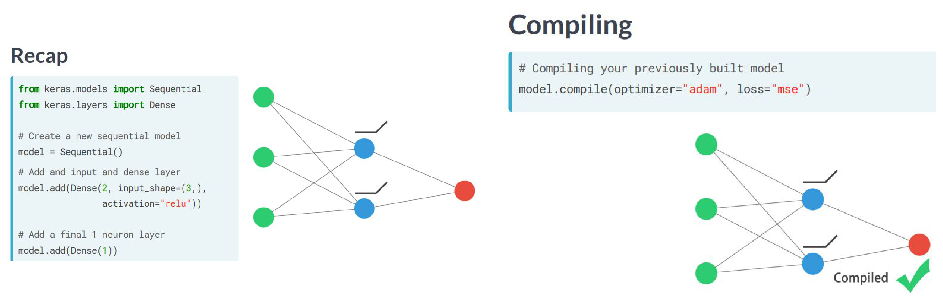

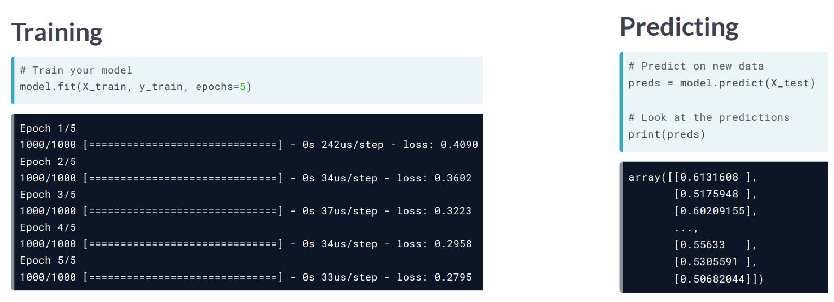

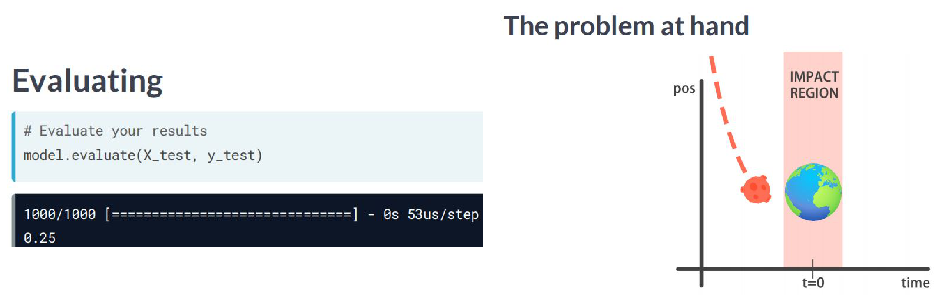

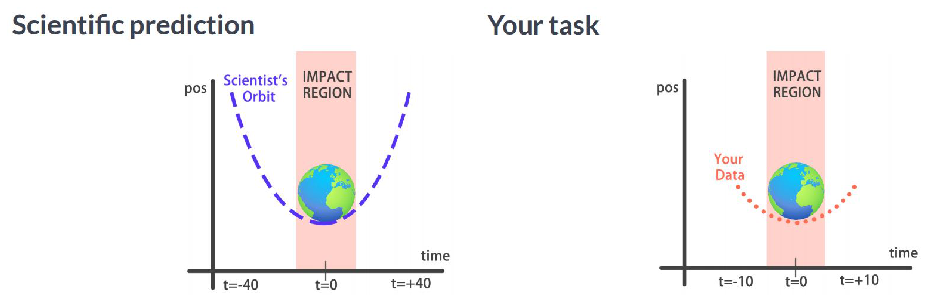

In [16]:
#vídeo
plot_2('recap', 'compiling'); plot_2('training', 'pred'); plot_2('eval', 'prob1'); plot_2('prob2', 'prob3')

Exercício 9

In [17]:
# Specifying a model

# You will build a simple regression model to predict the orbit of the meteor

# Instantiate a Sequential model
model = Sequential()

# Add a Dense layer with 50 neurons and an input of 1 neuron
model.add(Dense(50, input_shape=(1,), activation='relu'))

# Add two Dense layers with 50 neurons and relu activation
model.add(Dense(50, activation="relu"))
model.add(Dense(50, activation="relu"))

# End your model with a Dense layer and no activation
model.add(Dense(1))

print("""\nIt's important to note we aren't using an activation function in our output layer since y_positions aren't 
bounded and they can take any value. Your model is performing regression.""")


It's important to note we aren't using an activation function in our output layer since y_positions aren't 
bounded and they can take any value. Your model is performing regression.


Exercício 10

In [18]:
%%script false  # no data available

# Training

# Compile your model
model.compile(optimizer = 'adam', loss = 'mse')

print("Training started..., this can take a while:")

# Fit your model on your data for 30 epochs
model.fit(time_steps, y_positions, epochs = 30)

# Evaluate your model 
print("Final lost value:",model.evaluate(time_steps, y_positions))


Couldn't find program: 'false'


Exercício 11

In [19]:
%%script false
# Predicting the orbit

# Predict the twenty minutes orbit
twenty_min_orbit = model.predict(np.arange(-10, 11))

# Plot the twenty minute orbit 
plot_orbit(twenty_min_orbit)

####

# Predict the eighty minute orbit
eighty_min_orbit = model.predict(np.arange(-40, 41))

# Plot the eighty minute orbit 
plot_orbit(eighty_min_orbit)

Couldn't find program: 'false'


In [20]:
print("""Your model fits perfectly to the scientists trajectory for time values between -10 to +10, the region where the
meteor crosses the impact region, so we won't be hit! However, it starts to diverge when predicting for further values we
haven't trained for. This shows neural networks learn according to the data they are fed with. Data quality and diversity
are very important. You've barely scratched the surface of what neural networks can do.""")

Your model fits perfectly to the scientists trajectory for time values between -10 to +10, the region where the
meteor crosses the impact region, so we won't be hit! However, it starts to diverge when predicting for further values we
haven't trained for. This shows neural networks learn according to the data they are fed with. Data quality and diversity
are very important. You've barely scratched the surface of what neural networks can do.


# CHAPTER 2 - Going Deeper


By the end of this chapter, you will know how to solve binary, multi-class, and multi-label problems with neural networks. All of this by solving problems like detecting fake dollar bills, deciding who threw which dart at a board, and building an intelligent system to water your farm. You will also be able to plot model training metrics and to stop training and save your models when they no longer improve.

#### Exercício 1 - Binary classification

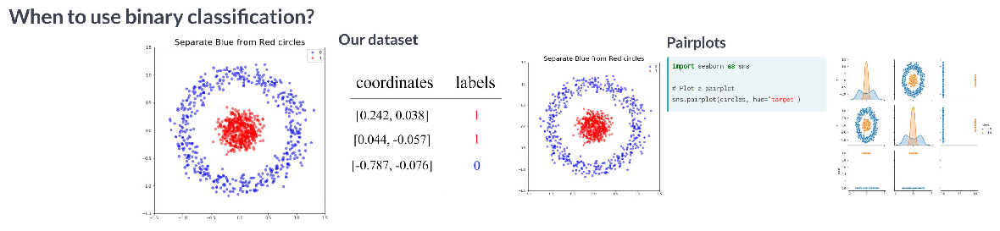

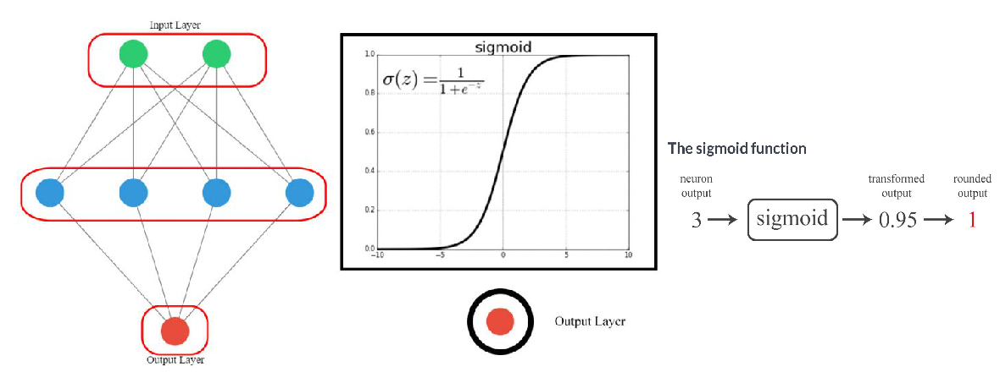

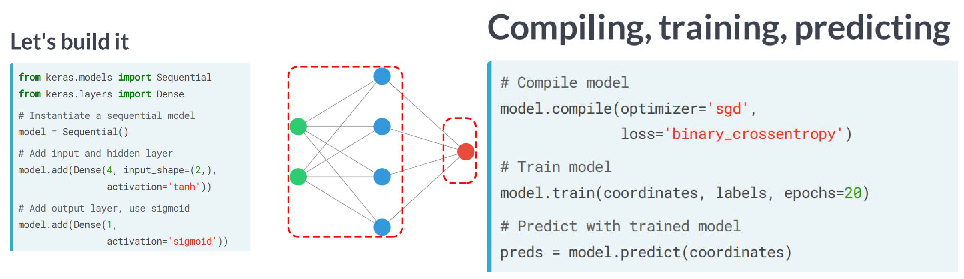

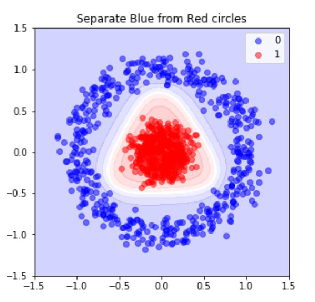

In [21]:
#vídeo
plot_3('binary', 'binary2', 'pairplots'); print("="*120); plot_3('scheme', 'sigmoid', 'sigmoid_f'); print("="*120)
plot_2('go', 'comp_train'); plot_1('predic')

Exercício 2

,variance,skewness,curtosis,entropy,class
0,3.62160,8.6661,-2.8073,-0.44699,0
1,4.54590,8.1674,-2.4586,-1.46210,0
2,3.86600,-2.6383,1.9242,0.10645,0
3,3.45660,9.5228,-4.0112,-3.59440,0
4,0.32924,-4.4552,4.5718,-0.98880,0


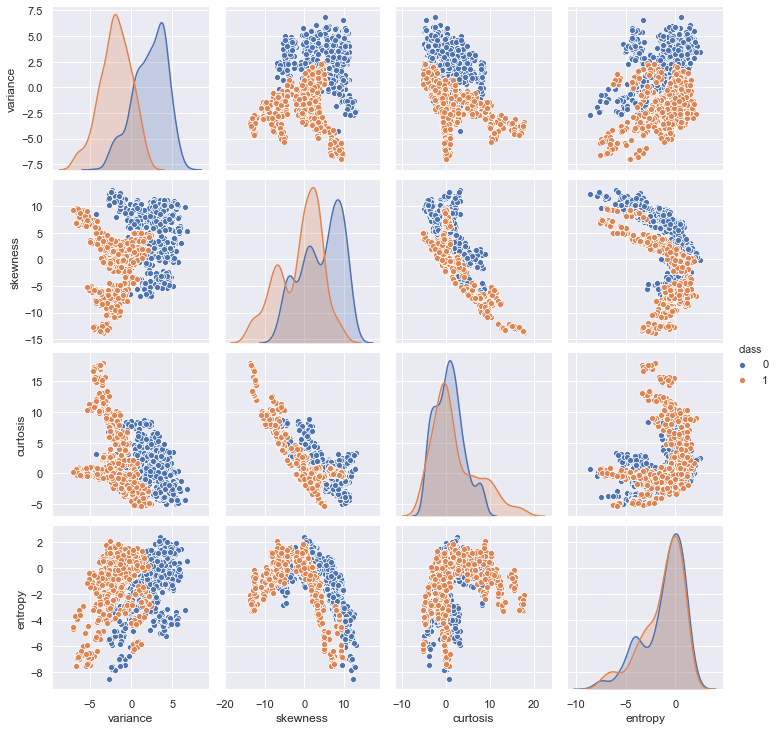

Dataset stats: 
           variance     skewness     curtosis      entropy        class
count  1372.000000  1372.000000  1372.000000  1372.000000  1372.000000
mean      0.433735     1.922353     1.397627    -1.191657     0.444606
std       2.842763     5.869047     4.310030     2.101013     0.497103
min      -7.042100   -13.773100    -5.286100    -8.548200     0.000000
25%      -1.773000    -1.708200    -1.574975    -2.413450     0.000000
50%       0.496180     2.319650     0.616630    -0.586650     0.000000
75%       2.821475     6.814625     3.179250     0.394810     1.000000
max       6.824800    12.951600    17.927400     2.449500     1.000000

Observations per class: 
 0    762
1    610
Name: class, dtype: int64


In [22]:
# Exploring dollar bills

# You will practice building classification models in Keras with the Banknote Authentication dataset.

banknotes = pd.read_csv(data_folder + "banknotes.xls")
banknotes.rename(columns={'variace':'variance'}, inplace=True)

# see head
display(banknotes.head())

#######################

# Use pairplot and set the hue to be our class
sns.pairplot(banknotes, hue='class') 
plt.show()

# Describe the data
print('Dataset stats: \n', banknotes.describe())

# Count the number of observations of each class
print('\nObservations per class: \n', banknotes['class'].value_counts())

Exercício 3

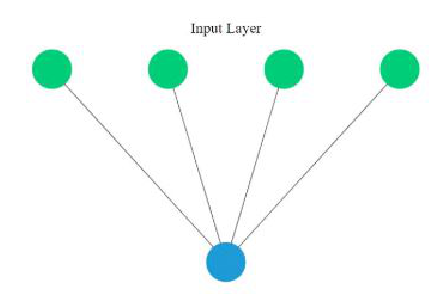

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_11 (Dense)             (None, 1)                 5         
Total params: 5
Trainable params: 5
Non-trainable params: 0
_________________________________________________________________


In [23]:
# A binary classification model

plot_1('ex_3')

# Import the sequential model and dense layer
from keras.models import Sequential
from keras.layers import Dense

# Create a sequential model
model = Sequential()

# Add a dense layer 
model.add(Dense(1, input_shape=(4,), activation='sigmoid'))

# Compile your model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['accuracy'])

# Display a summary of your model
model.summary()

Exercício 4

In [24]:
# Is this dollar bill fake ?

from sklearn.model_selection import train_test_split

X = banknotes.drop('class', axis=1).values
y = banknotes['class'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

###############################

# Train your model for 20 epochs
model.fit(X_train, y_train, epochs=20)

# Evaluate your model accuracy on the test set
accuracy = model.evaluate(X_test, y_test)[1]

# Print accuracy
print('\nAccuracy:',accuracy)

Epoch 1/20
960/960 [==============================] - 0s 158us/step - loss: 2.1019 - accuracy: 0.5219
Epoch 2/20
960/960 [==============================] - 0s 33us/step - loss: 1.4706 - accuracy: 0.5510
Epoch 3/20
960/960 [==============================] - 0s 35us/step - loss: 0.9637 - accuracy: 0.6167
Epoch 4/20
960/960 [==============================] - 0s 30us/step - loss: 0.6043 - accuracy: 0.7177
Epoch 5/20
960/960 [==============================] - 0s 74us/step - loss: 0.3804 - accuracy: 0.8344
Epoch 6/20
960/960 [==============================] - 0s 69us/step - loss: 0.2640 - accuracy: 0.9271
Epoch 7/20
960/960 [==============================] - 0s 55us/step - loss: 0.2134 - accuracy: 0.9740
Epoch 8/20
960/960 [==============================] - 0s 64us/step - loss: 0.1889 - accuracy: 0.9750
Epoch 9/20
960/960 [==============================] - 0s 34us/step - loss: 0.1743 - accuracy: 0.9740
Epoch 10/20
960/960 [==============================] - 0s 42us/step - loss: 0.1640 - accur

In [25]:
# só para experimentar um outro modelo clássico
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, random_state=1)
rf.fit(X_train, y_train)

# Predict test set labels
y_pred = rf.predict(X_test)
print("Random Forest Accuracy:", rf.score(X_test, y_test)) 

Random Forest Accuracy: 0.9951456310679612


#### Exercício 5 - Multi-class classification

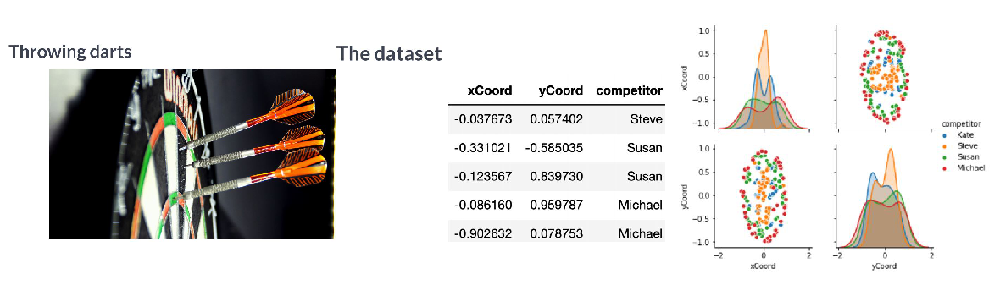

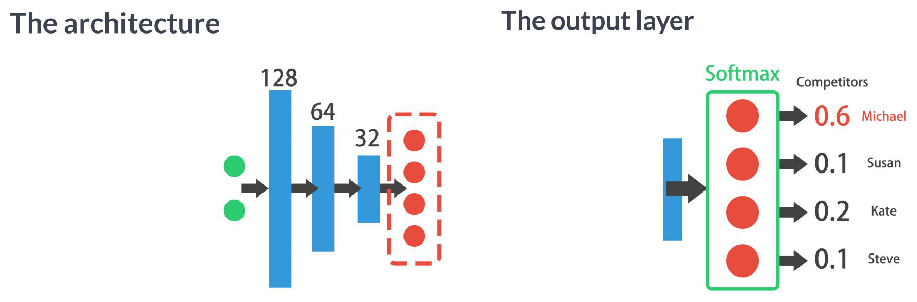

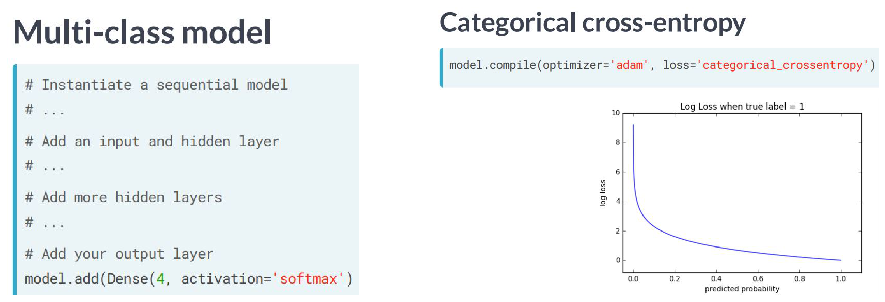

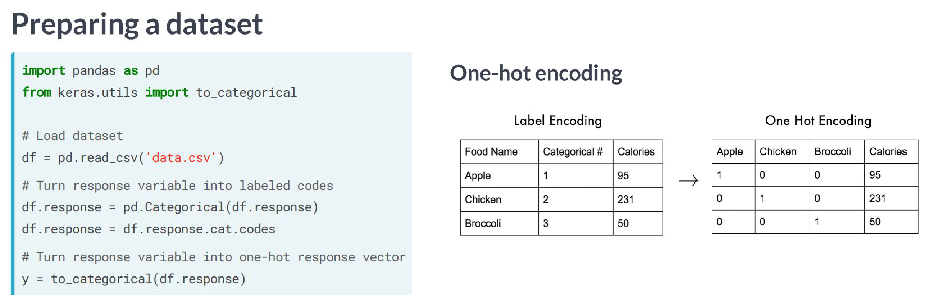

In [26]:
#vídeo
plot_3('darts_im', 'dataset', 'pairplot_darts'); print("="*120); plot_2('arch', 'output_layer')
plot_2('multi_class', 'cat_cross'); print("="*120); plot_2('preparing', 'one_hot')

Exercício 6

In [27]:
# A multi-class model

# Instantiate a sequential model
model = Sequential()
  
# Add 3 dense layers of 128, 64 and 32 neurons each
model.add(Dense(128, input_shape=(2,), activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
  
# Add a dense layer with as many neurons as competitors
model.add(Dense(4, activation='softmax'))
  
# Compile your model using categorical_crossentropy loss
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


Exercício 7

,xCoord,yCoord,competitor
0,0.196451,-0.520341,Steve
1,0.476027,-0.306763,Susan
2,0.003175,-0.980736,Michael
3,0.294078,0.267566,Kate
4,-0.051120,0.598946,Steve


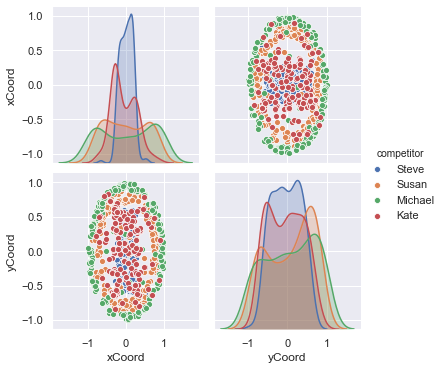

In [28]:
# Prepare your dataset

darts = pd.read_csv(data_folder + "darts.xls")
display(darts.head())

# Use pairplot and set the hue to be our class
sns.pairplot(darts, hue='competitor') 
plt.show()

In [29]:
# Transform into a categorical variable
darts.competitor = pd.Categorical(darts.competitor)

# Assign a number to each category (label encoding)
darts.competitor = darts.competitor.cat.codes 

# Print the label encoded competitors
display(darts.head())

,xCoord,yCoord,competitor
0,0.196451,-0.520341,2
1,0.476027,-0.306763,3
2,0.003175,-0.980736,1
3,0.294078,0.267566,0
4,-0.051120,0.598946,2


In [30]:
# Import to_categorical from keras utils module
from keras.utils import to_categorical

# Use to_categorical on your labels
coordinates = darts.drop(['competitor'], axis=1)
competitors = to_categorical(darts.competitor)

# Now print the to_categorical() result
print('One-hot encoded competitors: \n',competitors)

One-hot encoded competitors: 
 [[0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 ...
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]]


Exercício 8

In [31]:
# Training on dart throwers

coord_train, coord_test, competitors_train, competitors_test = train_test_split(coordinates, competitors, test_size=0.2, 
                                                                                random_state=1)

# Train your model on the training data for 200 epochs
model.fit(coord_train, competitors_train, epochs=200)

# Evaluate your model accuracy on the test data
accuracy = model.evaluate(coord_test, competitors_test)[1]

# Print accuracy
print('\nAccuracy:', accuracy)

Epoch 1/200
640/640 [==============================] - 0s 263us/step - loss: 1.3744 - accuracy: 0.3719
Epoch 2/200
640/640 [==============================] - 0s 47us/step - loss: 1.3378 - accuracy: 0.3453
Epoch 3/200
640/640 [==============================] - 0s 81us/step - loss: 1.2866 - accuracy: 0.4766
Epoch 4/200
640/640 [==============================] - 0s 58us/step - loss: 1.2071 - accuracy: 0.5203
Epoch 5/200
640/640 [==============================] - 0s 67us/step - loss: 1.1035 - accuracy: 0.5547
Epoch 6/200
640/640 [==============================] - 0s 64us/step - loss: 0.9926 - accuracy: 0.5828
Epoch 7/200
640/640 [==============================] - 0s 55us/step - loss: 0.9194 - accuracy: 0.5859
Epoch 8/200
640/640 [==============================] - 0s 69us/step - loss: 0.8861 - accuracy: 0.6281
Epoch 9/200
640/640 [==============================] - 0s 66us/step - loss: 0.8497 - accuracy: 0.6328
Epoch 10/200
640/640 [==============================] - 0s 55us/step - loss: 0.82

640/640 [==============================] - 0s 67us/step - loss: 0.5687 - accuracy: 0.7969
Epoch 81/200
640/640 [==============================] - 0s 72us/step - loss: 0.5695 - accuracy: 0.7937
Epoch 82/200
640/640 [==============================] - 0s 67us/step - loss: 0.5775 - accuracy: 0.7844
Epoch 83/200
640/640 [==============================] - 0s 73us/step - loss: 0.5610 - accuracy: 0.8047
Epoch 84/200
640/640 [==============================] - 0s 66us/step - loss: 0.5645 - accuracy: 0.7906
Epoch 85/200
640/640 [==============================] - 0s 67us/step - loss: 0.5528 - accuracy: 0.8078
Epoch 86/200
640/640 [==============================] - 0s 61us/step - loss: 0.5653 - accuracy: 0.8047
Epoch 87/200
640/640 [==============================] - 0s 62us/step - loss: 0.5581 - accuracy: 0.8016
Epoch 88/200
640/640 [==============================] - 0s 55us/step - loss: 0.5540 - accuracy: 0.8000
Epoch 89/200
640/640 [==============================] - 0s 61us/step - loss: 0.5614 - 

640/640 [==============================] - 0s 59us/step - loss: 0.5136 - accuracy: 0.8109
Epoch 160/200
640/640 [==============================] - 0s 58us/step - loss: 0.5152 - accuracy: 0.8062
Epoch 161/200
640/640 [==============================] - 0s 59us/step - loss: 0.5203 - accuracy: 0.7984
Epoch 162/200
640/640 [==============================] - 0s 61us/step - loss: 0.5214 - accuracy: 0.8000
Epoch 163/200
640/640 [==============================] - 0s 59us/step - loss: 0.5280 - accuracy: 0.8000
Epoch 164/200
640/640 [==============================] - 0s 62us/step - loss: 0.5133 - accuracy: 0.8000
Epoch 165/200
640/640 [==============================] - 0s 56us/step - loss: 0.5096 - accuracy: 0.8094
Epoch 166/200
640/640 [==============================] - 0s 56us/step - loss: 0.5066 - accuracy: 0.8016
Epoch 167/200
640/640 [==============================] - 0s 55us/step - loss: 0.5034 - accuracy: 0.8109
Epoch 168/200
640/640 [==============================] - 0s 59us/step - loss: 

Exercício 9

In [32]:
# Softmax predictions

# Since you used the softmax activation function, for every input of 2 coordinates provided to your model there's an output
# vector of 4 numbers. Each of these numbers encodes the probability of a given dart being thrown by one of the 4 possible
# competitors.

# When computing accuracy with the model's .evaluate() method, your model takes the class with the highest probability as 
# the prediction. np.argmax() can help you do this since it returns the index with the highest value in an array.

# Use the collection of test throws stored in coords_small_test and np.argmax() to check this out.

coords_small_test = coord_test.sample(n=5, random_state=0)
competitors_small_test = competitors_test[np.random.choice(len(competitors_test), 5)]
display(coords_small_test)
display(competitors_small_test)

#####

# Predict on coords_small_test
preds = model.predict(coords_small_test)

# Print preds vs true values
print("{:45} | {}".format('Raw Model Predictions','True labels'))

for i, pred in enumerate(preds):
    print("{} | {}".format(pred, competitors_small_test[i]))

,xCoord,yCoord
309,0.967989,-0.238562
50,0.775449,0.498133
307,-0.735480,0.490291
430,0.251037,0.053344
439,-0.616343,-0.393817


array([[0., 1., 0., 0.],
       [0., 0., 0., 1.],
       [1., 0., 0., 0.],
       [0., 0., 0., 1.],
       [1., 0., 0., 0.]], dtype=float32)

Raw Model Predictions                         | True labels
[1.3898922e-03 9.9829179e-01 2.7976534e-04 3.8609920e-05] | [0. 1. 0. 0.]
[5.0917664e-03 9.9207687e-01 1.5802908e-04 2.6733819e-03] | [0. 0. 0. 1.]
[0.13758074 0.17829512 0.01075128 0.67337286] | [1. 0. 0. 0.]
[0.52808684 0.01119348 0.43544754 0.02527211] | [0. 0. 0. 1.]
[3.2335245e-03 7.8840140e-04 2.3257153e-05 9.9595487e-01] | [1. 0. 0. 0.]


In [33]:
# Extract the indexes of the highest probable predictions
preds = [np.argmax(pred) for pred in preds]

# Print preds vs true values
print("{:10} | {}".format('Rounded Model Predictions','True labels'))
for i,pred in enumerate(preds):
    print("{:25} | {}".format(pred, competitors_small_test[i]))
    
print("""\nAs you've seen you can easily interpret the softmax output. This can also help you spot those observations where
your network is less certain on which class to predict, since you can see the probability distribution among classes.""")

Rounded Model Predictions | True labels
                        1 | [0. 1. 0. 0.]
                        1 | [0. 0. 0. 1.]
                        3 | [1. 0. 0. 0.]
                        0 | [0. 0. 0. 1.]
                        3 | [1. 0. 0. 0.]

As you've seen you can easily interpret the softmax output. This can also help you spot those observations where
your network is less certain on which class to predict, since you can see the probability distribution among classes.


#### Exercício 10 - Multi-label classification

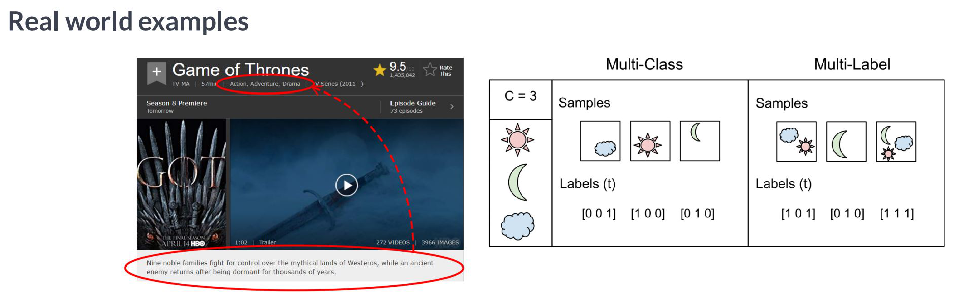

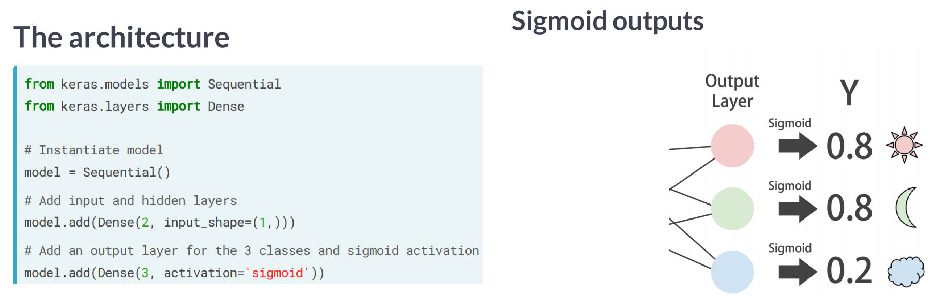

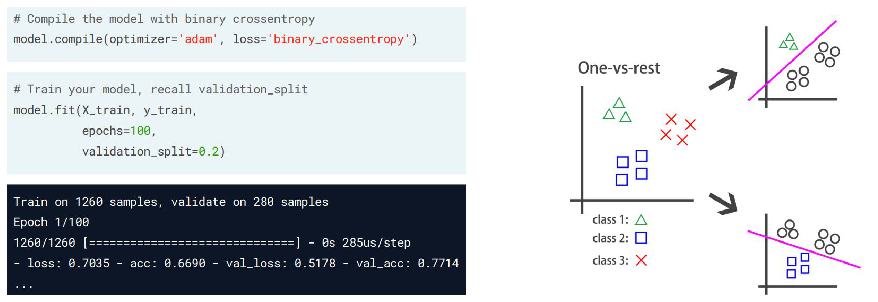

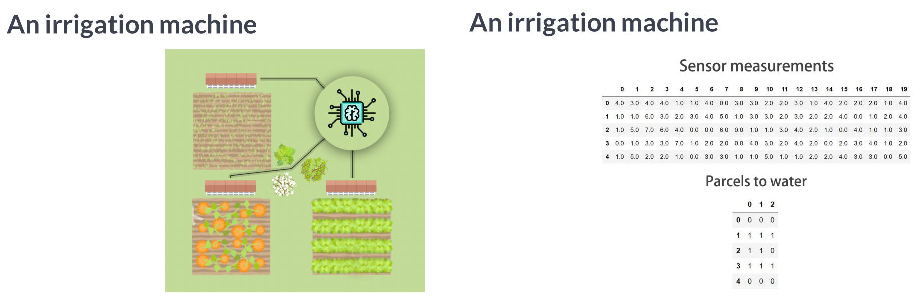

In [34]:
#vídeo

plot_2('multi_label1', 'multi_label2'); print("="*120); plot_2('arch1', 'sig_out'); print("="*120);
plot_2('compile1', 'one_rest'); print("="*120); plot_2('irrig1', 'irrig2')

Exercício 11

In [35]:
# An irrigation machine

# Instantiate a Sequential model
model = Sequential()

# Add a hidden layer of 64 neurons and a 20 neuron's input
model.add(Dense(64, input_shape=(20,), activation='relu'))

# Add an output layer of 3 neurons with sigmoid activation
model.add(Dense(3, activation='sigmoid'))

# Compile your model with adam and binary crossentropy loss
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_16 (Dense)             (None, 64)                1344      
_________________________________________________________________
dense_17 (Dense)             (None, 3)                 195       
Total params: 1,539
Trainable params: 1,539
Non-trainable params: 0
_________________________________________________________________


Exercício 12

In [36]:
# Training with multiple labels

irrigation_machine = pd.read_csv(data_folder + "irrigation_machine.csv").drop('Unnamed: 0', axis=1)
display(irrigation_machine.head())

X = irrigation_machine.drop(['parcel_0', 'parcel_1', 'parcel_2'], axis=1)
y = irrigation_machine[['parcel_0', 'parcel_1', 'parcel_2']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

,sensor_0,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,...,sensor_13,sensor_14,sensor_15,sensor_16,sensor_17,sensor_18,sensor_19,parcel_0,parcel_1,parcel_2
0,1.0,2.0,1.0,7.0,0.0,1.0,1.0,4.0,0.0,3.0,...,8.0,1.0,0.0,2.0,1.0,9.0,2.0,0,1,0
1,5.0,1.0,3.0,5.0,2.0,2.0,1.0,2.0,3.0,1.0,...,4.0,5.0,5.0,2.0,2.0,2.0,7.0,0,0,0
2,3.0,1.0,4.0,3.0,4.0,0.0,1.0,6.0,0.0,2.0,...,3.0,3.0,1.0,0.0,3.0,1.0,0.0,1,1,0
3,2.0,2.0,4.0,3.0,5.0,0.0,3.0,2.0,2.0,5.0,...,4.0,1.0,1.0,4.0,1.0,3.0,2.0,0,0,0
4,4.0,3.0,3.0,2.0,5.0,1.0,3.0,1.0,1.0,2.0,...,1.0,3.0,2.0,2.0,1.0,1.0,0.0,1,1,0


In [37]:
# Train for 100 epochs using a validation split of 0.2
model.fit(X_train, y_train, epochs = 100, validation_split = 0.2, verbose=0)

# Predict on sensors_test and round up the predictions
preds = model.predict(X_test)
preds_rounded = np.round(preds)

# Print rounded preds
print('\nRounded Predictions: \n', preds_rounded)

# Evaluate your model's accuracy on the test data
accuracy = model.evaluate(X_test, y_test)[1]

# Print accuracy
print('\nAccuracy:', accuracy)


Rounded Predictions: 
 [[1. 1. 0.]
 [0. 1. 0.]
 [0. 1. 0.]
 ...
 [1. 1. 0.]
 [0. 1. 0.]
 [1. 1. 1.]]
600/600 [==============================] - 0s 25us/step

Accuracy: 0.9055556058883667


#### Exercício 13 - Keras callbacks

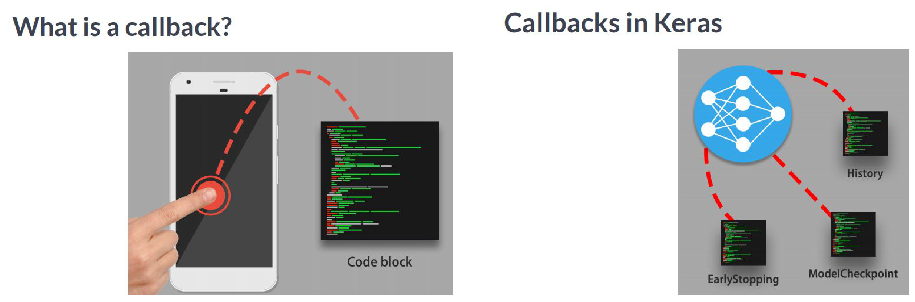

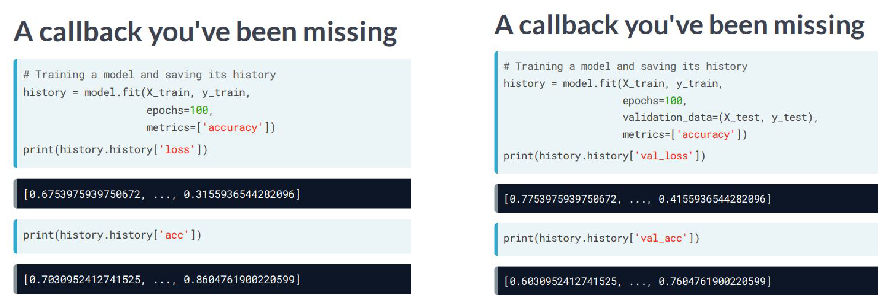

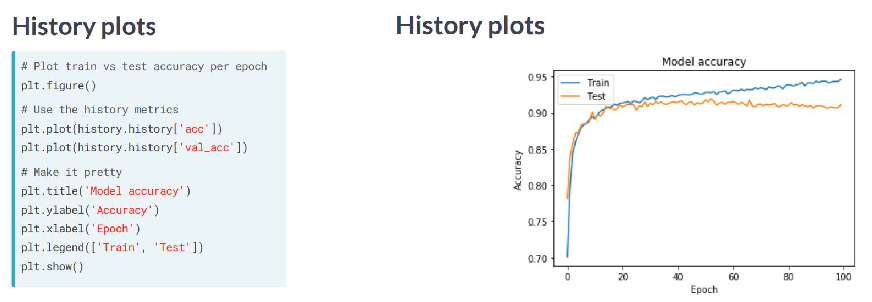

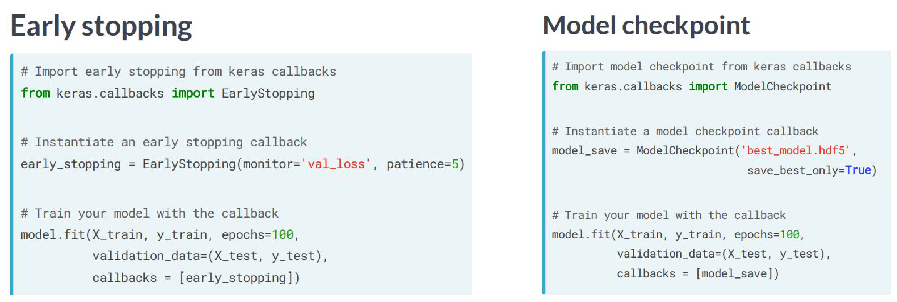

In [38]:
#vídeo
plot_2('callback', 'callback2'); plot_2('callback3', 'callback4'); print("="*120); plot_2('history_plot', 'histplot2')
print("="*120); plot_2('early_stop', 'model_checkpoint')

Exercício 14

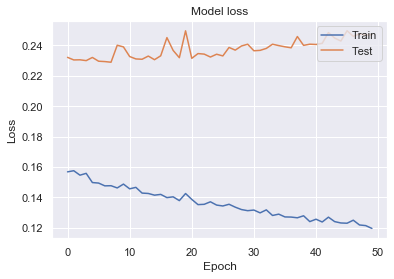

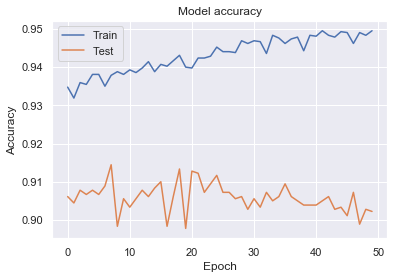

These graphs are really useful for detecting overfitting and to know if your neural network would benefit from
more training data. More on this on the next chapter. (não saiu exatamente como no ex.)


In [39]:
# The history callback

def plot_loss(loss, val_loss):
    plt.figure()
    plt.plot(loss)
    plt.plot(val_loss)
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper right')
    plt.show()
    
def plot_accuracy(acc, val_acc):
    # Plot training & validation accuracy values
    plt.figure()
    plt.plot(acc)
    plt.plot(val_acc)
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()
    
##############################################################################

# Train your model and save its history
history = model.fit(X_train, y_train, epochs = 50, validation_data=(X_test, y_test), verbose=0)


# Plot train vs test loss during training
plot_loss(history.history['loss'], history.history['val_loss'])

# Plot train vs test accuracy during training
plot_accuracy(history.history['accuracy'], history.history['val_accuracy'])

print("""These graphs are really useful for detecting overfitting and to know if your neural network would benefit from
more training data. More on this on the next chapter. (não saiu exatamente como no ex.)""")

Exercício 15

In [40]:
# Early stopping your model

# The early stopping callback is useful since it allows for you to stop the model training if it no longer improves after 
# a given number of epochs. 

# Import the early stopping callback
from keras.callbacks import EarlyStopping

# Define a callback to monitor val_acc
monitor_val_acc = EarlyStopping(monitor='val_acc', patience=5)

# Train your model using the early stopping callback
model.fit(X_train, y_train, epochs=200, validation_data=(X_test, y_test), callbacks=[monitor_val_acc])


Train on 1400 samples, validate on 600 samples
Epoch 1/200
1400/1400 [==============================] - 0s 87us/step - loss: 0.1195 - accuracy: 0.9514 - val_loss: 0.2485 - val_accuracy: 0.9006
Epoch 2/200
1400/1400 [==============================] - 0s 85us/step - loss: 0.1187 - accuracy: 0.9521 - val_loss: 0.2519 - val_accuracy: 0.8956
Epoch 3/200
 800/1400 [================>.............] - ETA: 0s - loss: 0.1146 - accuracy: 0.9550

C:\Users\Admin\anaconda3\lib\site-packages\keras\callbacks\callbacks.py:846: RuntimeWarning: Early stopping conditioned on metric `val_acc` which is not available. Available metrics are: val_loss,val_accuracy,loss,accuracy
  (self.monitor, ','.join(list(logs.keys()))), RuntimeWarning


1400/1400 [==============================] - 0s 80us/step - loss: 0.1206 - accuracy: 0.9502 - val_loss: 0.2462 - val_accuracy: 0.8989
Epoch 4/200
1400/1400 [==============================] - 0s 62us/step - loss: 0.1174 - accuracy: 0.9514 - val_loss: 0.2518 - val_accuracy: 0.9017
Epoch 5/200
1400/1400 [==============================] - 0s 66us/step - loss: 0.1186 - accuracy: 0.9526 - val_loss: 0.2489 - val_accuracy: 0.9039
Epoch 6/200
1400/1400 [==============================] - 0s 66us/step - loss: 0.1175 - accuracy: 0.9526 - val_loss: 0.2495 - val_accuracy: 0.9017
Epoch 7/200
1400/1400 [==============================] - 0s 86us/step - loss: 0.1166 - accuracy: 0.9524 - val_loss: 0.2521 - val_accuracy: 0.9006
Epoch 8/200
1400/1400 [==============================] - 0s 66us/step - loss: 0.1175 - accuracy: 0.9538 - val_loss: 0.2563 - val_accuracy: 0.8978
Epoch 9/200
1400/1400 [==============================] - 0s 66us/step - loss: 0.1146 - accuracy: 0.9552 - val_loss: 0.2577 - val_accurac

Epoch 59/200
1400/1400 [==============================] - 0s 74us/step - loss: 0.0938 - accuracy: 0.9655 - val_loss: 0.2875 - val_accuracy: 0.8894
Epoch 60/200
1400/1400 [==============================] - 0s 47us/step - loss: 0.0923 - accuracy: 0.9667 - val_loss: 0.2897 - val_accuracy: 0.8883
Epoch 61/200
1400/1400 [==============================] - 0s 59us/step - loss: 0.0941 - accuracy: 0.9638 - val_loss: 0.2939 - val_accuracy: 0.8928
Epoch 62/200
1400/1400 [==============================] - 0s 56us/step - loss: 0.0916 - accuracy: 0.9671 - val_loss: 0.2929 - val_accuracy: 0.8917
Epoch 63/200
1400/1400 [==============================] - 0s 64us/step - loss: 0.0918 - accuracy: 0.9667 - val_loss: 0.2940 - val_accuracy: 0.8944
Epoch 64/200
1400/1400 [==============================] - 0s 64us/step - loss: 0.0923 - accuracy: 0.9643 - val_loss: 0.2905 - val_accuracy: 0.8872
Epoch 65/200
1400/1400 [==============================] - 0s 62us/step - loss: 0.0919 - accuracy: 0.9657 - val_loss: 0

1400/1400 [==============================] - 0s 59us/step - loss: 0.0759 - accuracy: 0.9724 - val_loss: 0.3397 - val_accuracy: 0.8878
Epoch 115/200
1400/1400 [==============================] - 0s 61us/step - loss: 0.0743 - accuracy: 0.9721 - val_loss: 0.3365 - val_accuracy: 0.8906
Epoch 116/200
1400/1400 [==============================] - 0s 58us/step - loss: 0.0742 - accuracy: 0.9729 - val_loss: 0.3352 - val_accuracy: 0.8833
Epoch 117/200
1400/1400 [==============================] - 0s 59us/step - loss: 0.0744 - accuracy: 0.9755 - val_loss: 0.3376 - val_accuracy: 0.8833
Epoch 118/200
1400/1400 [==============================] - 0s 59us/step - loss: 0.0736 - accuracy: 0.9740 - val_loss: 0.3395 - val_accuracy: 0.8850
Epoch 119/200
1400/1400 [==============================] - 0s 56us/step - loss: 0.0742 - accuracy: 0.9726 - val_loss: 0.3425 - val_accuracy: 0.8861
Epoch 120/200
1400/1400 [==============================] - 0s 65us/step - loss: 0.0759 - accuracy: 0.9721 - val_loss: 0.3387 -

1400/1400 [==============================] - 0s 54us/step - loss: 0.0609 - accuracy: 0.9798 - val_loss: 0.3822 - val_accuracy: 0.8822
Epoch 170/200
1400/1400 [==============================] - 0s 46us/step - loss: 0.0623 - accuracy: 0.9783 - val_loss: 0.3898 - val_accuracy: 0.8817
Epoch 171/200
1400/1400 [==============================] - 0s 59us/step - loss: 0.0622 - accuracy: 0.9802 - val_loss: 0.3872 - val_accuracy: 0.8794
Epoch 172/200
1400/1400 [==============================] - 0s 56us/step - loss: 0.0616 - accuracy: 0.9800 - val_loss: 0.3848 - val_accuracy: 0.8856
Epoch 173/200
1400/1400 [==============================] - 0s 56us/step - loss: 0.0605 - accuracy: 0.9812 - val_loss: 0.3877 - val_accuracy: 0.8828
Epoch 174/200
1400/1400 [==============================] - 0s 59us/step - loss: 0.0600 - accuracy: 0.9810 - val_loss: 0.3913 - val_accuracy: 0.8817
Epoch 175/200
1400/1400 [==============================] - 0s 59us/step - loss: 0.0602 - accuracy: 0.9805 - val_loss: 0.3890 -

Exercício 16

In [41]:
# A combination of callbacks

# Import the EarlyStopping and ModelCheckpoint callbacks
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Early stop on validation accuracy
monitor_val_acc = EarlyStopping(monitor = 'val_acc', patience = 3)

# Save the best model as best_banknote_model.hdf5
modelCheckpoint = ModelCheckpoint(data_folder + 'best_banknote_model.hdf5', save_best_only = True)

# Fit your model for a very-large-unthinkable amount of epochs (vou "reduzir" para 400)
history = model.fit(X_train, y_train,
                    epochs = 400,
                    callbacks = [monitor_val_acc, modelCheckpoint],
                    validation_data = (X_test, y_test))


Train on 1400 samples, validate on 600 samples
Epoch 1/400
1400/1400 [==============================] - 0s 82us/step - loss: 0.0528 - accuracy: 0.9845 - val_loss: 0.4169 - val_accuracy: 0.8811
Epoch 2/400
1400/1400 [==============================] - 0s 92us/step - loss: 0.0547 - accuracy: 0.9831 - val_loss: 0.4192 - val_accuracy: 0.8811
Epoch 3/400
1400/1400 [==============================] - 0s 101us/step - loss: 0.0538 - accuracy: 0.9840 - val_loss: 0.4206 - val_accuracy: 0.8789
Epoch 4/400
1400/1400 [==============================] - 0s 91us/step - loss: 0.0553 - accuracy: 0.9836 - val_loss: 0.4217 - val_accuracy: 0.8806
Epoch 5/400
1400/1400 [==============================] - 0s 85us/step - loss: 0.0520 - accuracy: 0.9852 - val_loss: 0.4198 - val_accuracy: 0.8822
Epoch 6/400
1400/1400 [==============================] - 0s 86us/step - loss: 0.0524 - accuracy: 0.9855 - val_loss: 0.4233 - val_accuracy: 0.8783
Epoch 7/400
1400/1400 [==============================] - 0s 87us/step - loss

1400/1400 [==============================] - 0s 51us/step - loss: 0.0416 - accuracy: 0.9895 - val_loss: 0.4712 - val_accuracy: 0.8828
Epoch 57/400
1400/1400 [==============================] - 0s 63us/step - loss: 0.0420 - accuracy: 0.9879 - val_loss: 0.4736 - val_accuracy: 0.8794
Epoch 58/400
1400/1400 [==============================] - 0s 58us/step - loss: 0.0413 - accuracy: 0.9893 - val_loss: 0.4697 - val_accuracy: 0.8822
Epoch 59/400
1400/1400 [==============================] - 0s 59us/step - loss: 0.0414 - accuracy: 0.9890 - val_loss: 0.4816 - val_accuracy: 0.8800
Epoch 60/400
1400/1400 [==============================] - 0s 54us/step - loss: 0.0438 - accuracy: 0.9883 - val_loss: 0.4818 - val_accuracy: 0.8844
Epoch 61/400
1400/1400 [==============================] - 0s 58us/step - loss: 0.0423 - accuracy: 0.9895 - val_loss: 0.4875 - val_accuracy: 0.8833
Epoch 62/400
1400/1400 [==============================] - 0s 56us/step - loss: 0.0422 - accuracy: 0.9888 - val_loss: 0.4751 - val_a

Epoch 112/400
1400/1400 [==============================] - 0s 76us/step - loss: 0.0323 - accuracy: 0.9933 - val_loss: 0.5425 - val_accuracy: 0.8794
Epoch 113/400
1400/1400 [==============================] - 0s 76us/step - loss: 0.0326 - accuracy: 0.9921 - val_loss: 0.5490 - val_accuracy: 0.8761
Epoch 114/400
1400/1400 [==============================] - 0s 76us/step - loss: 0.0323 - accuracy: 0.9936 - val_loss: 0.5389 - val_accuracy: 0.8833
Epoch 115/400
1400/1400 [==============================] - 0s 66us/step - loss: 0.0311 - accuracy: 0.9945 - val_loss: 0.5371 - val_accuracy: 0.8783
Epoch 116/400
1400/1400 [==============================] - 0s 51us/step - loss: 0.0324 - accuracy: 0.9936 - val_loss: 0.5444 - val_accuracy: 0.8761
Epoch 117/400
1400/1400 [==============================] - 0s 52us/step - loss: 0.0334 - accuracy: 0.9929 - val_loss: 0.5394 - val_accuracy: 0.8772
Epoch 118/400
1400/1400 [==============================] - 0s 54us/step - loss: 0.0309 - accuracy: 0.9933 - val_

1400/1400 [==============================] - 0s 70us/step - loss: 0.0250 - accuracy: 0.9964 - val_loss: 0.5970 - val_accuracy: 0.8800
Epoch 168/400
1400/1400 [==============================] - 0s 71us/step - loss: 0.0249 - accuracy: 0.9967 - val_loss: 0.6055 - val_accuracy: 0.8789
Epoch 169/400
1400/1400 [==============================] - 0s 68us/step - loss: 0.0246 - accuracy: 0.9964 - val_loss: 0.6070 - val_accuracy: 0.8811
Epoch 170/400
1400/1400 [==============================] - 0s 76us/step - loss: 0.0249 - accuracy: 0.9964 - val_loss: 0.6090 - val_accuracy: 0.8789
Epoch 171/400
1400/1400 [==============================] - 0s 73us/step - loss: 0.0243 - accuracy: 0.9976 - val_loss: 0.6025 - val_accuracy: 0.8761
Epoch 172/400
1400/1400 [==============================] - 0s 59us/step - loss: 0.0255 - accuracy: 0.9960 - val_loss: 0.6069 - val_accuracy: 0.8739
Epoch 173/400
1400/1400 [==============================] - 0s 62us/step - loss: 0.0242 - accuracy: 0.9974 - val_loss: 0.6115 -

1400/1400 [==============================] - 0s 66us/step - loss: 0.0190 - accuracy: 0.9979 - val_loss: 0.6759 - val_accuracy: 0.8783
Epoch 223/400
1400/1400 [==============================] - 0s 56us/step - loss: 0.0190 - accuracy: 0.9986 - val_loss: 0.6757 - val_accuracy: 0.8789
Epoch 224/400
1400/1400 [==============================] - 0s 56us/step - loss: 0.0184 - accuracy: 0.9981 - val_loss: 0.6822 - val_accuracy: 0.8722
Epoch 225/400
1400/1400 [==============================] - 0s 46us/step - loss: 0.0178 - accuracy: 0.9983 - val_loss: 0.6791 - val_accuracy: 0.8711
Epoch 226/400
1400/1400 [==============================] - 0s 56us/step - loss: 0.0178 - accuracy: 0.9988 - val_loss: 0.6768 - val_accuracy: 0.8761
Epoch 227/400
1400/1400 [==============================] - 0s 56us/step - loss: 0.0188 - accuracy: 0.9981 - val_loss: 0.6848 - val_accuracy: 0.8783
Epoch 228/400
1400/1400 [==============================] - 0s 74us/step - loss: 0.0180 - accuracy: 0.9988 - val_loss: 0.6903 -

1400/1400 [==============================] - 0s 54us/step - loss: 0.0128 - accuracy: 0.9995 - val_loss: 0.7670 - val_accuracy: 0.8756
Epoch 278/400
1400/1400 [==============================] - 0s 68us/step - loss: 0.0139 - accuracy: 0.9990 - val_loss: 0.7545 - val_accuracy: 0.8728
Epoch 279/400
1400/1400 [==============================] - 0s 61us/step - loss: 0.0133 - accuracy: 0.9993 - val_loss: 0.7556 - val_accuracy: 0.8756
Epoch 280/400
1400/1400 [==============================] - 0s 53us/step - loss: 0.0131 - accuracy: 0.9998 - val_loss: 0.7538 - val_accuracy: 0.8733
Epoch 281/400
1400/1400 [==============================] - 0s 57us/step - loss: 0.0131 - accuracy: 0.9998 - val_loss: 0.7677 - val_accuracy: 0.8689
Epoch 282/400
1400/1400 [==============================] - 0s 56us/step - loss: 0.0131 - accuracy: 0.9995 - val_loss: 0.7714 - val_accuracy: 0.8717
Epoch 283/400
1400/1400 [==============================] - 0s 55us/step - loss: 0.0124 - accuracy: 0.9998 - val_loss: 0.7601 -

1400/1400 [==============================] - 0s 73us/step - loss: 0.0095 - accuracy: 0.9998 - val_loss: 0.8438 - val_accuracy: 0.8689
Epoch 333/400
1400/1400 [==============================] - 0s 72us/step - loss: 0.0090 - accuracy: 1.0000 - val_loss: 0.8474 - val_accuracy: 0.8678
Epoch 334/400
1400/1400 [==============================] - 0s 70us/step - loss: 0.0099 - accuracy: 1.0000 - val_loss: 0.8535 - val_accuracy: 0.8711
Epoch 335/400
1400/1400 [==============================] - 0s 71us/step - loss: 0.0089 - accuracy: 0.9998 - val_loss: 0.8514 - val_accuracy: 0.8700
Epoch 336/400
1400/1400 [==============================] - 0s 70us/step - loss: 0.0093 - accuracy: 0.9998 - val_loss: 0.8570 - val_accuracy: 0.8694
Epoch 337/400
1400/1400 [==============================] - 0s 69us/step - loss: 0.0091 - accuracy: 1.0000 - val_loss: 0.8442 - val_accuracy: 0.8733
Epoch 338/400
1400/1400 [==============================] - 0s 74us/step - loss: 0.0089 - accuracy: 0.9998 - val_loss: 0.8596 -

1400/1400 [==============================] - 0s 103us/step - loss: 0.0070 - accuracy: 1.0000 - val_loss: 0.9259 - val_accuracy: 0.8672
Epoch 388/400
1400/1400 [==============================] - 0s 86us/step - loss: 0.0065 - accuracy: 1.0000 - val_loss: 0.9343 - val_accuracy: 0.8689
Epoch 389/400
1400/1400 [==============================] - 0s 152us/step - loss: 0.0062 - accuracy: 1.0000 - val_loss: 0.9330 - val_accuracy: 0.8689
Epoch 390/400
1400/1400 [==============================] - 0s 110us/step - loss: 0.0064 - accuracy: 1.0000 - val_loss: 0.9392 - val_accuracy: 0.8700
Epoch 391/400
1400/1400 [==============================] - 0s 98us/step - loss: 0.0064 - accuracy: 1.0000 - val_loss: 0.9374 - val_accuracy: 0.8700
Epoch 392/400
1400/1400 [==============================] - 0s 91us/step - loss: 0.0068 - accuracy: 1.0000 - val_loss: 0.9421 - val_accuracy: 0.8700
Epoch 393/400
1400/1400 [==============================] - 0s 94us/step - loss: 0.0060 - accuracy: 1.0000 - val_loss: 0.946

# CHAPTER 3 - Improving Your Model Performance

You will now learn how to interpret learning curves to understand your models as they train. You will also visualize the effects of activation functions, batch-sizes, and batch-normalization. Finally, you will learn how to perform automatic hyperparameter optimization to your Keras models using sklearn.

#### Exercício 1 - Learning curves

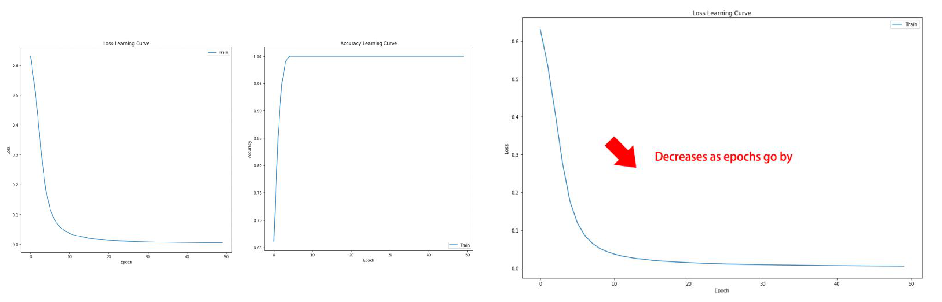

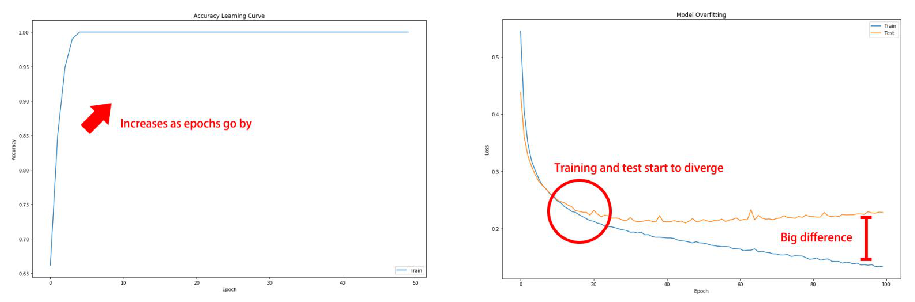

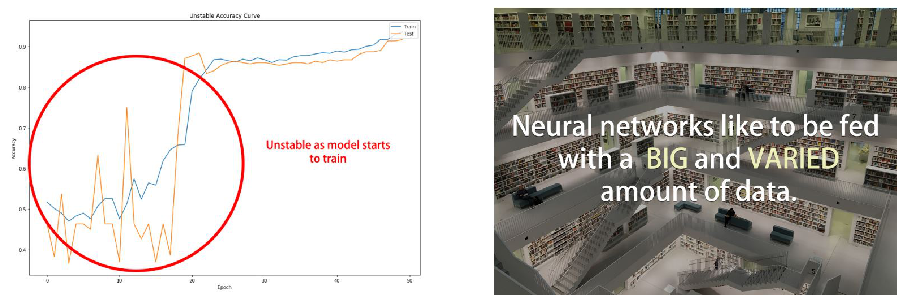

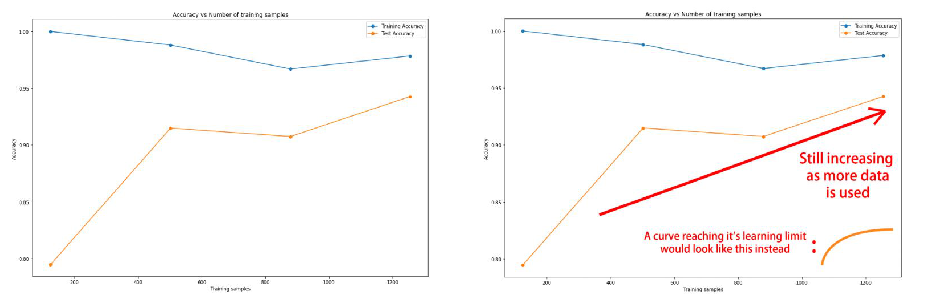

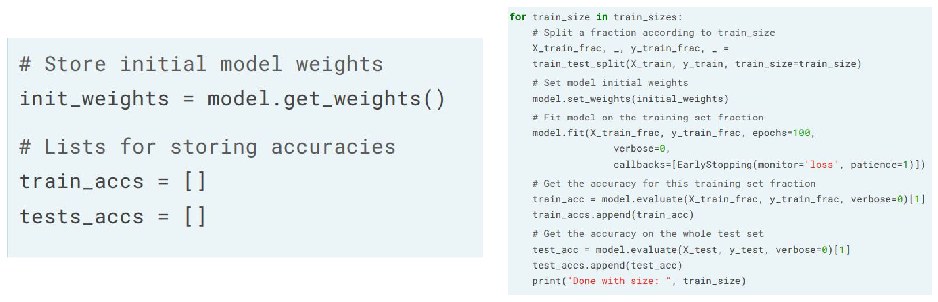

In [42]:
#vídeo
plot_2('31', '32'); plot_2('33', '34'); plot_2('35', '36'); plot_2('37', '38'); plot_2('39', '40')

Exercício 2

In [43]:
# Learning the digits

digits_pixels = np.load(data_folder + 'digits_pixels.npy')
digits_target = np.load(data_folder + 'digits_target.npy')
digits_target = pd.get_dummies(digits_target)

X_train, X_test, y_train, y_test = train_test_split(digits_pixels, digits_target, test_size=0.3, random_state=1)

##########################################

# Instantiate a Sequential model
model = Sequential()

# Input and hidden layer with input_shape, 16 neurons, and relu 
model.add(Dense(16, input_shape = (64,), activation = 'relu'))

# Output layer with 10 neurons (one per digit) and softmax
model.add(Dense(10, activation='softmax'))

# Compile your model
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

# Test if your model works and can process input data
print(model.predict(X_train))
print("""\nPredicting on training data inputs before training can help you quickly check that your model works as 
expected.""")

[[9.28014288e-06 9.32515506e-03 1.83683864e-04 ... 2.71810632e-06
  1.40301424e-07 9.08281308e-08]
 [1.20747592e-10 4.20453752e-08 5.40603606e-09 ... 1.09039924e-07
  3.50900264e-09 1.53454489e-11]
 [2.11542375e-08 1.59866858e-07 3.90443278e-09 ... 1.12259204e-05
  8.09589267e-07 2.69466116e-09]
 ...
 [6.44074234e-08 2.63701496e-03 2.06578378e-07 ... 4.51832639e-05
  1.19763910e-09 8.53349544e-11]
 [4.72936579e-10 1.77547299e-05 4.96462453e-05 ... 8.52359960e-08
  8.82002693e-10 1.32500668e-11]
 [5.08033047e-08 9.11315874e-06 5.86676236e-08 ... 2.54223750e-07
  3.69988769e-08 9.70327847e-07]]

Predicting on training data inputs before training can help you quickly check that your model works as 
expected.


Exercício 3

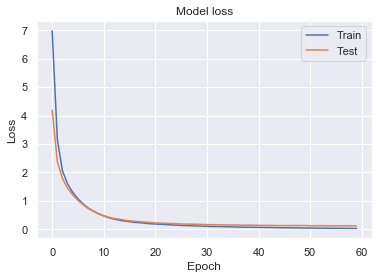

Question:
Just by looking at the overall picture, do you think the learning curve shows this model is overfitting after having 
trained for 60 epochs?

Answer: No, the test loss is not getting higher as the epochs go by


In [44]:
# Is the model overfitting?

# Train your model for 60 epochs, using X_test and y_test as validation data
history = model.fit(X_train, y_train, epochs=60, validation_data=(X_test, y_test), verbose=0)

# Extract from the history object loss and val_loss to plot the learning curve
plot_loss(history.history['loss'], history.history['val_loss'])

print("""Question:
Just by looking at the overall picture, do you think the learning curve shows this model is overfitting after having 
trained for 60 epochs?

Answer: No, the test loss is not getting higher as the epochs go by""")

Exercício 4

540/540 [==============================] - 0s 22us/step


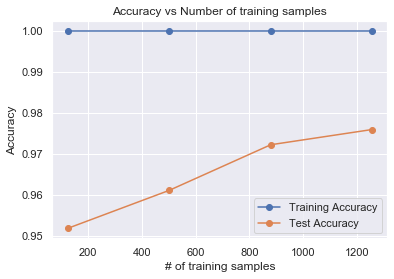

The results shows that your model would not benefit a lot from more training data, since the test set is
starting to flatten in accuracy already.


In [45]:
# Do we need more data?

training_sizes = np.array([125, 502, 879, 1255])
initial_weights = model.get_weights()
early_stop = EarlyStopping(monitor='loss', patience=5)
train_accs, test_accs = [], []

def plot_results(train_accs,test_accs):
    plt.plot(training_sizes, train_accs, 'o-', label="Training Accuracy")
    plt.plot(training_sizes, test_accs, 'o-', label="Test Accuracy")
    plt.title('Accuracy vs Number of training samples')
    plt.xlabel('# of training samples')
    plt.ylabel('Accuracy')
    plt.legend(loc="best")
    plt.show()

##################################################################################

for size in training_sizes:
    # Get a fraction of training data (we only care about the training data)
    X_train_frac, y_train_frac = X_train[:size], y_train[:size]

    # Reset the model to the initial weights and train it on the new data fraction
    model.set_weights(initial_weights)
    model.fit(X_train_frac, y_train_frac, epochs = 50, callbacks = [early_stop], verbose=0)

    # Evaluate and store the train fraction and the complete test set results
    train_accs.append(model.evaluate(X_train_frac, y_train_frac)[1])
    test_accs.append(model.evaluate(X_test, y_test)[1])
    
# Plot train vs test accuracies
plot_results(train_accs, test_accs)

print("""The results shows that your model would not benefit a lot from more training data, since the test set is
starting to flatten in accuracy already.""")

#### Exercício 5 - Activation functions

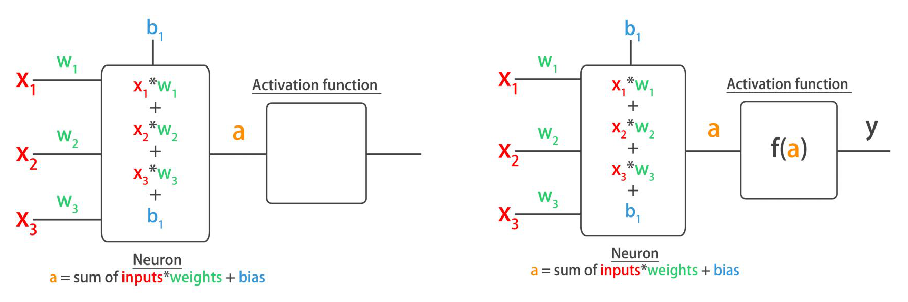

Sigmoid, Tanh;   ReLU, Leaky ReLU


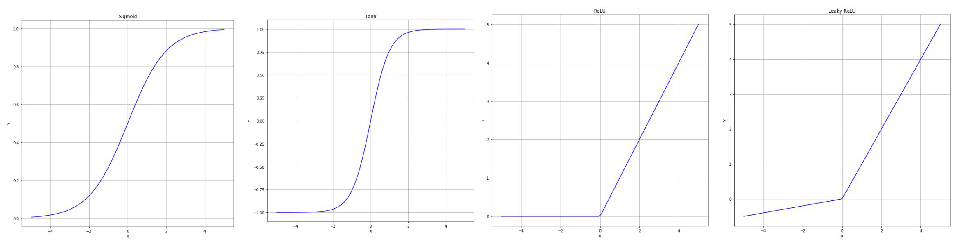

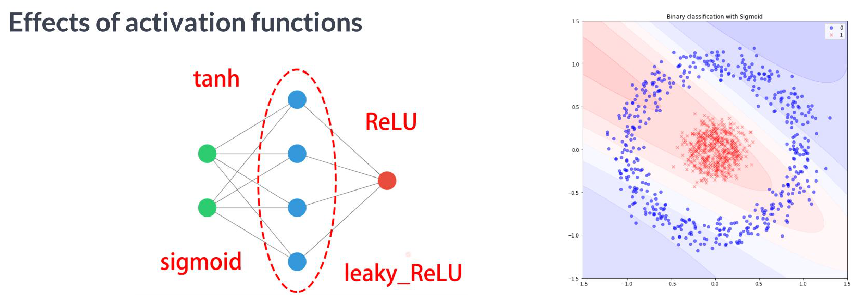

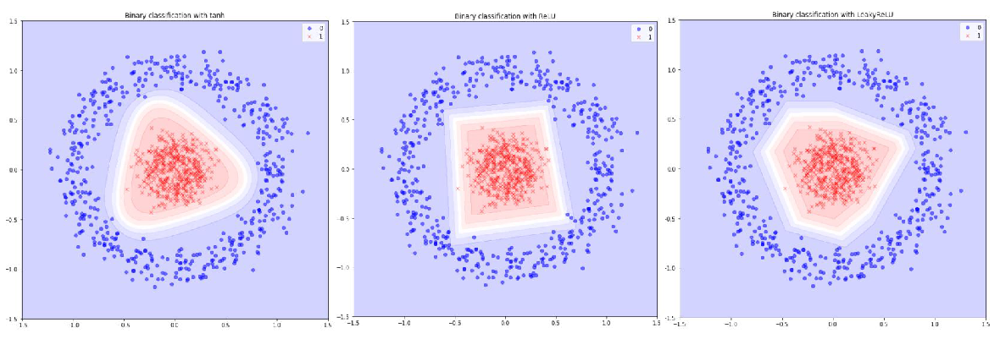

In [46]:
#vídeo
plot_2('activation', 'activationf'); print("="*120); print("Sigmoid, Tanh;   ReLU, Leaky ReLU"); plot_2('sig_tanh', 'relu')
print("="*120); plot_2('effects', 'sigmoid_act'); plot_3('tanh', 'relu_act', 'leeaky')

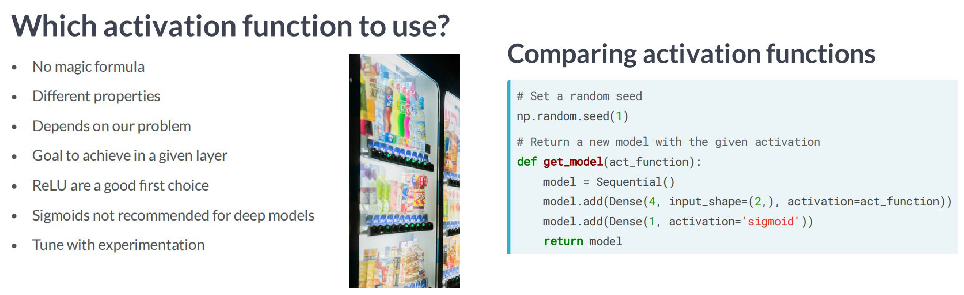

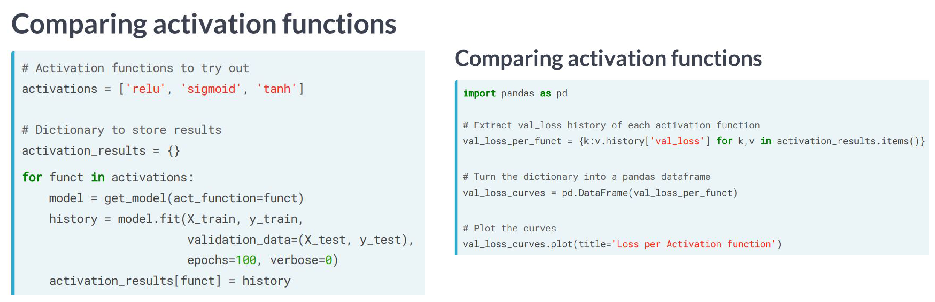

In [47]:
plot_2('which_act', 'comparing', wspace=0.1); plot_2('comparing2', 'comparing3')

Exercício 6

In [48]:
# Different activation functions

# The sigmoid(),tanh(), ReLU(), and leaky_ReLU() functions have been defined and ready for you to use. Each function
# receives an input number X and returns its corresponding Y value.

# Which of the statements below is false?
print("False:")
print("""The sigmoid() and tanh() both take values close to -1 for big negative numbers. 
(True: For big negative numbers the sigmoid approaches 0 not -1 whilst the tanh() does take values close to -1.)""")

False:
The sigmoid() and tanh() both take values close to -1 for big negative numbers. 
(True: For big negative numbers the sigmoid approaches 0 not -1 whilst the tanh() does take values close to -1.)


Exercício 7

In [49]:
# Comparing activation functions

# from keras.utils import ModelWrapper

def get_model(act_function, activations=['relu', 'sigmoid', 'tanh']):
    if act_function not in activations:
        raise ValueError('Make sure your activation functions are named correctly.')
    print("Finishing with", act_function, "...")    
    
    model = Sequential()
    model.add(Dense(64, input_shape=(20,), activation=act_function))
    model.add(Dense(3, activation='sigmoid'))
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model


# multi-label model you built for your irrigation machine in chapter 2
irrigation_machine = pd.read_csv(data_folder + "irrigation_machine.csv").drop('Unnamed: 0', axis=1)
display(irrigation_machine.head())
X = irrigation_machine.drop(['parcel_0', 'parcel_1', 'parcel_2'], axis=1)
y = irrigation_machine[['parcel_0', 'parcel_1', 'parcel_2']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

#########################################################################

# Activation functions to try
activations = ['relu', 'sigmoid', 'tanh']

# Loop over the activation functions
activation_results = {}

for act in activations:
    # Get a new model with the current activation
    model = get_model(act)
    # Fit the model
    history = model.fit(X_train, y_train, epochs=20, verbose=0, validation_data=(X_test, y_test))
    activation_results[act] = history
    
activation_results

,sensor_0,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,...,sensor_13,sensor_14,sensor_15,sensor_16,sensor_17,sensor_18,sensor_19,parcel_0,parcel_1,parcel_2
0,1.0,2.0,1.0,7.0,0.0,1.0,1.0,4.0,0.0,3.0,...,8.0,1.0,0.0,2.0,1.0,9.0,2.0,0,1,0
1,5.0,1.0,3.0,5.0,2.0,2.0,1.0,2.0,3.0,1.0,...,4.0,5.0,5.0,2.0,2.0,2.0,7.0,0,0,0
2,3.0,1.0,4.0,3.0,4.0,0.0,1.0,6.0,0.0,2.0,...,3.0,3.0,1.0,0.0,3.0,1.0,0.0,1,1,0
3,2.0,2.0,4.0,3.0,5.0,0.0,3.0,2.0,2.0,5.0,...,4.0,1.0,1.0,4.0,1.0,3.0,2.0,0,0,0
4,4.0,3.0,3.0,2.0,5.0,1.0,3.0,1.0,1.0,2.0,...,1.0,3.0,2.0,2.0,1.0,1.0,0.0,1,1,0


Finishing with relu ...
Finishing with sigmoid ...
Finishing with tanh ...


{'relu': <keras.callbacks.callbacks.History at 0x29c3c158f48>,
 'sigmoid': <keras.callbacks.callbacks.History at 0x29c39705c88>,
 'tanh': <keras.callbacks.callbacks.History at 0x29c34e2df88>}

Exercício 8

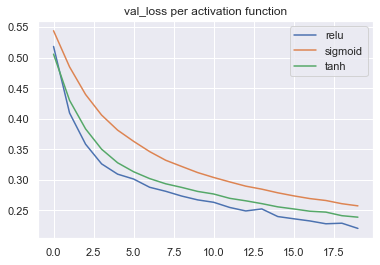

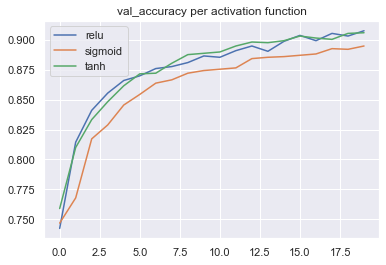

In [50]:
# Comparing activation functions II

val_loss_per_function = {k:v.history['val_loss'] for k,v in activation_results.items()}
val_accuracy_per_function = {k:v.history['val_accuracy'] for k,v in activation_results.items()}

# Create a dataframe from val_loss_per_function
val_loss= pd.DataFrame(val_loss_per_function)

# Call plot on the dataframe
val_loss.plot(title='val_loss per activation function')
plt.show()

# Create a dataframe from val_acc_per_function
val_acc = pd.DataFrame(val_accuracy_per_function)

# Call plot on the dataframe
val_acc.plot(title='val_accuracy per activation function')
plt.show()

#### Exercício 9 - Batch size and batch normalization

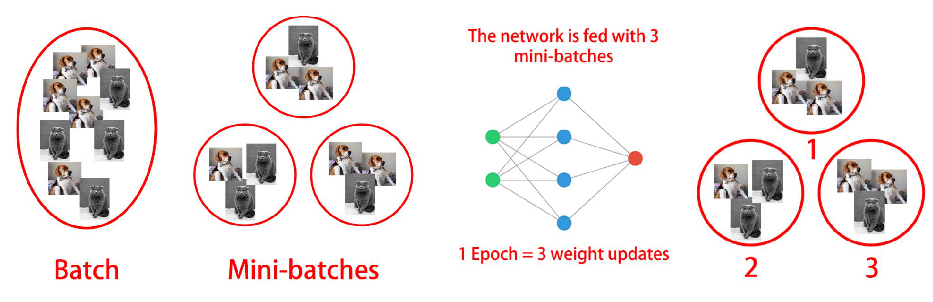

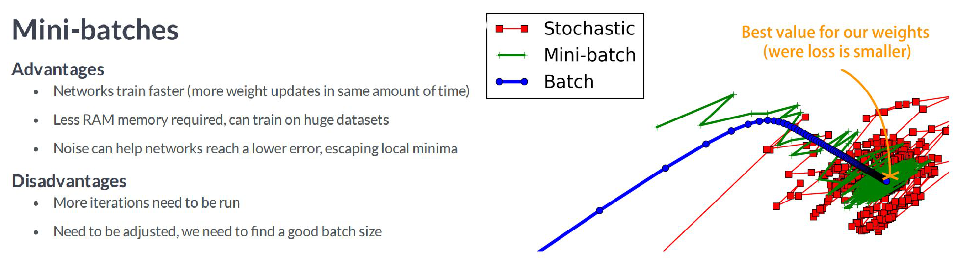

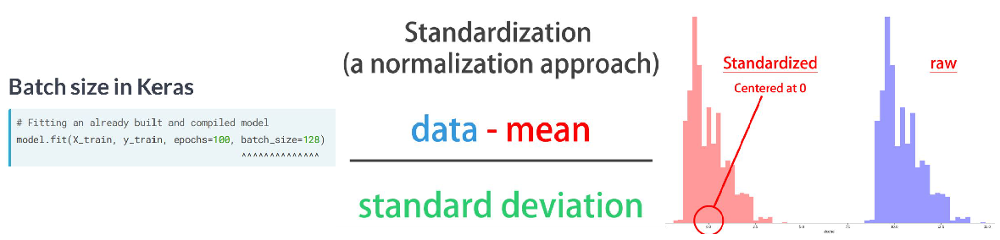

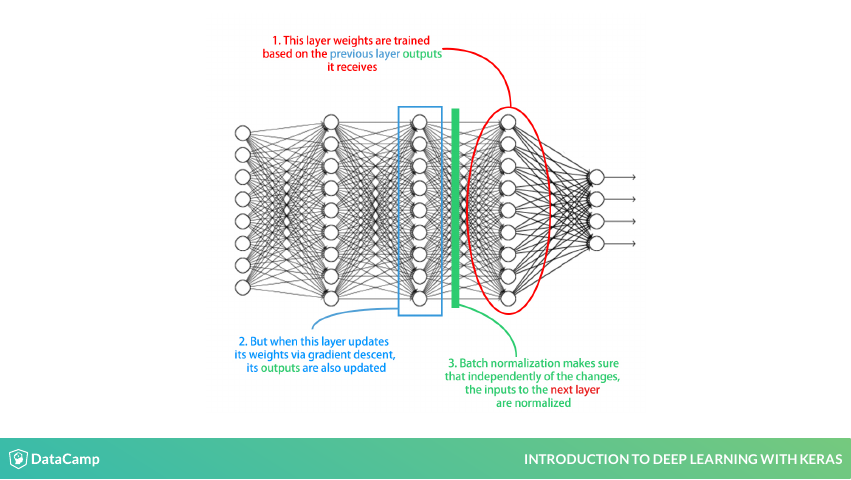

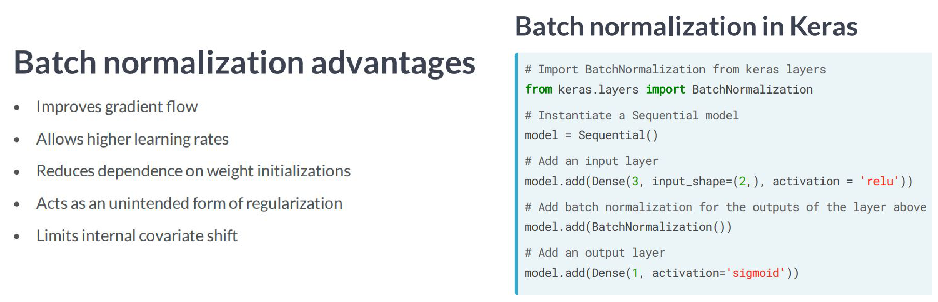

In [51]:
#vídeo

from keras.layers import BatchNormalization

plot_2('batch', 'mini'); print("="*120); plot_2('mini2', 'mini3'); print("="*120); plot_3('batch_size', 'stand', 'stand2')
print("="*120); display(pdf_3[34]) ; plot_2('batch_norm', 'batch_norm2')

Exercício 10

,xCoord,yCoord,competitor
0,0.196451,-0.520341,Steve
1,0.476027,-0.306763,Susan
2,0.003175,-0.980736,Michael
3,0.294078,0.267566,Kate
4,-0.051120,0.598946,Steve


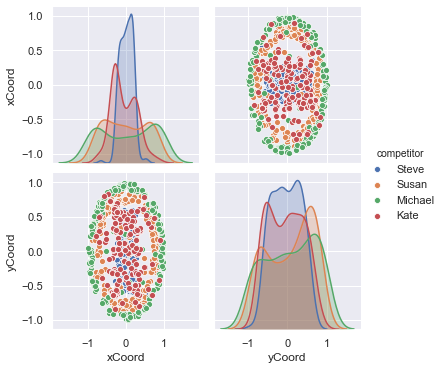

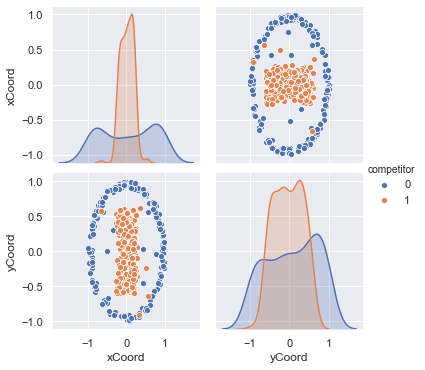

In [52]:
# Changing batch sizes

# Prepare your dataset - vou adaptar a dataset dos darts para substituir a do exemplo do ex. (blue vs red dots)
darts2 = pd.read_csv(data_folder + "darts.xls")
display(darts2.head())
sns.pairplot(darts2, hue='competitor') 

# choose only 2 ("red" and "blue")
from sklearn.preprocessing import LabelEncoder
darts2 = darts2[(darts2['competitor'] == 'Steve') | (darts2['competitor'] == 'Michael')]
darts2['competitor'] = LabelEncoder().fit_transform(darts2['competitor'])
sns.pairplot(darts2, hue='competitor') 
plt.show()

In [53]:
def get_model():
    model = Sequential()
    model.add(Dense(4,input_shape=(2,),activation='relu'))
    model.add(Dense(1,activation="sigmoid"))
    model.compile('sgd', 'binary_crossentropy', metrics=['accuracy'])
    return model

X = darts2.drop(['competitor'], axis=1).values
y = darts2['competitor'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

#####################################################################################################

# Get a fresh new model with get_model
model = get_model()

# Train your model for 5 epochs with a batch size of 1
model.fit(X_train, y_train, epochs=5, batch_size=1)
print("\n The accuracy when using a batch of size 1 is: ", model.evaluate(X_test, y_test)[1])

Epoch 1/5
280/280 [==============================] - 1s 2ms/step - loss: 0.6758 - accuracy: 0.5464
Epoch 2/5
280/280 [==============================] - 0s 1ms/step - loss: 0.6560 - accuracy: 0.6286
Epoch 3/5
280/280 [==============================] - 0s 1ms/step - loss: 0.6357 - accuracy: 0.6714
Epoch 4/5
280/280 [==============================] - 0s 1ms/step - loss: 0.6137 - accuracy: 0.8357
Epoch 5/5
120/120 [==============================] - 0s 200us/step

 The accuracy when using a batch of size 1 is:  0.9166666865348816


In [54]:
model = get_model()

# Train your model for 5 epochs with a batch size of lenght of training
model.fit(X_train, y_train, epochs=5, batch_size=int(len(X)*0.7), verbose=0)
print("\n The accuracy when using a batch of size 1 is: ", model.evaluate(X_test, y_test)[1])

print("""\nYou can see that accuracy is lower when using a batch size equal to the number of classes. This is not because
the network had more trouble learning the optimization function. Even though the same number of epochs were used for both
batch sizes the number of resulting weight updates was different. With a batch size of 1 and 5 epochs we get 5 * number of
samples weight updates, with a batch of size the number of samples and 5 epochs we only get 5 updates total.""")

120/120 [==============================] - 0s 183us/step

 The accuracy when using a batch of size 1 is:  0.4583333432674408

You can see that accuracy is lower when using a batch size equal to the number of classes. This is not because
the network had more trouble learning the optimization function. Even though the same number of epochs were used for both
batch sizes the number of resulting weight updates was different. With a batch size of 1 and 5 epochs we get 5 * number of
samples weight updates, with a batch of size the number of samples and 5 epochs we only get 5 updates total.





Exercício 11

In [55]:
# Batch normalizing a familiar model

# Remember the digits dataset you trained in the first exercise of this chapter?
# A multi-class classification problem that you solved using softmax and 10 neurons in your output layer.
# You will now build a new deeper model consisting of 3 hidden layers of 50 neurons each, using batch normalization in
# between layers. The kernel_initializer parameter is used to initialize weights in a similar way.

digits_pixels = np.load(data_folder + 'digits_pixels.npy')
digits_target = np.load(data_folder + 'digits_target.npy')
digits_target = pd.get_dummies(digits_target)
X_train, X_test, y_train, y_test = train_test_split(digits_pixels, digits_target, test_size=0.3, random_state=1)

#############################################

# Import batch normalization from keras layers
from keras.layers import BatchNormalization

# Build your deep network
batchnorm_model = Sequential()
batchnorm_model.add(Dense(50, input_shape=(64,), activation='relu', kernel_initializer='normal'))
batchnorm_model.add(BatchNormalization())
batchnorm_model.add(Dense(50, activation='relu', kernel_initializer='normal'))
batchnorm_model.add(BatchNormalization())
batchnorm_model.add(Dense(50, activation='relu', kernel_initializer='normal'))
batchnorm_model.add(BatchNormalization())
batchnorm_model.add(Dense(10, activation='softmax', kernel_initializer='normal'))

# Compile your model with sgd
batchnorm_model.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy'])

Exercício 12

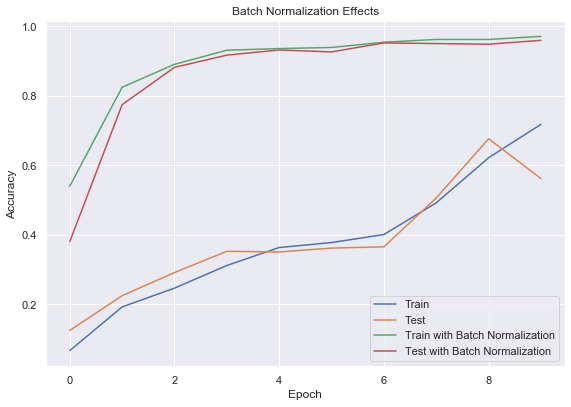

You can see that for this deep model batch normalization proved to be useful, helping the model obtain high
accuracy values just over the first 10 training epochs.


In [56]:
# Batch normalization effects

# An exact copy of it without batch normalization: standard_model
standard_model = Sequential()
standard_model.add(Dense(50, input_shape=(64,), activation='relu', kernel_initializer='normal'))
standard_model.add(Dense(50, activation='relu', kernel_initializer='normal'))
standard_model.add(Dense(50, activation='relu', kernel_initializer='normal'))
standard_model.add(Dense(10, activation='softmax', kernel_initializer='normal'))
standard_model.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy'])

def compare_histories_acc(h1, h2):
    plt.plot(h1.history['accuracy'])
    plt.plot(h1.history['val_accuracy'])
    plt.plot(h2.history['accuracy'])
    plt.plot(h2.history['val_accuracy'])
    plt.title("Batch Normalization Effects")
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(['Train', 'Test', 'Train with Batch Normalization', 'Test with Batch Normalization'], loc='best')
    plt.subplots_adjust(left=0, bottom=-0.2, right=1.2, top=1, wspace=0, hspace=0)
    plt.show()

#######################

# Train your standard model, storing its history
history1 = standard_model.fit(X_train, y_train, validation_data=(X_test,y_test), epochs=10, verbose=0)

# Train the batch normalized model you recently built, store its history
history2 = batchnorm_model.fit(X_train, y_train, validation_data=(X_test,y_test), epochs=10, verbose=0)

# Call compare_acc_histories passing in both model histories
compare_histories_acc(history1, history2)

print("""You can see that for this deep model batch normalization proved to be useful, helping the model obtain high
accuracy values just over the first 10 training epochs.""")

#### Exercício 13 - Hyperparameter tuning

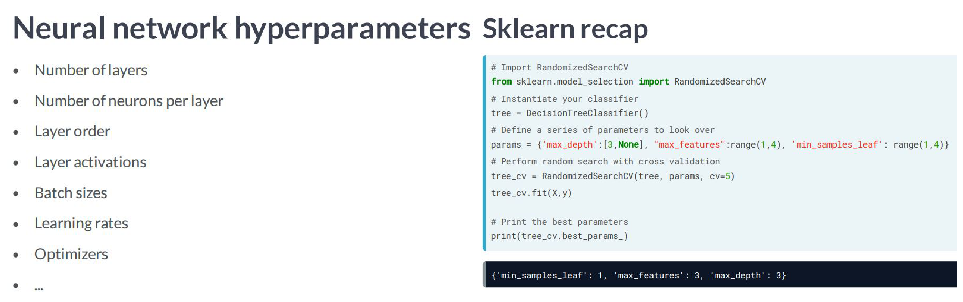

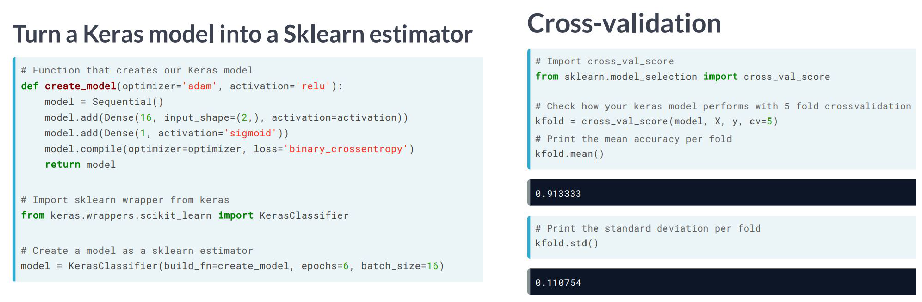

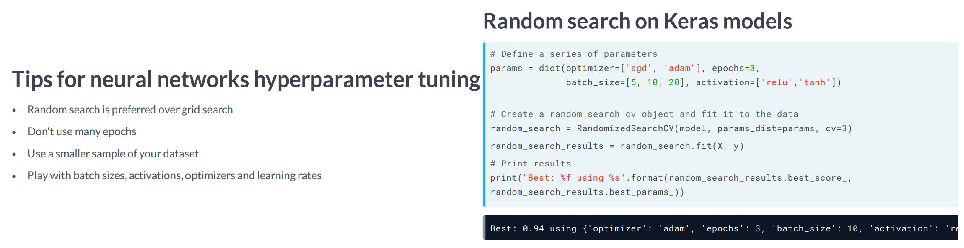

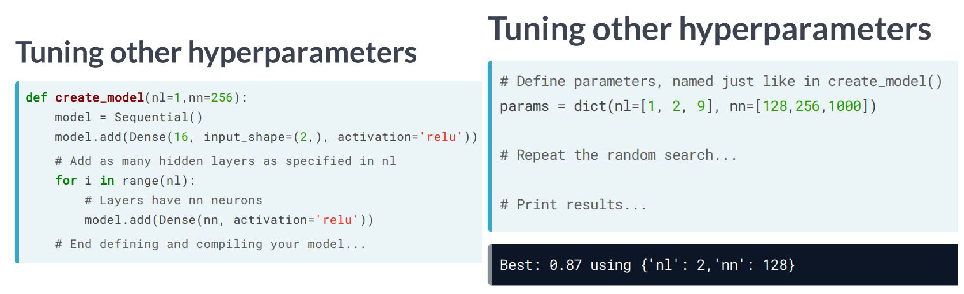

In [57]:
#vídeo
from sklearn.model_selection import RandomizedSearchCV, cross_val_score
from keras.wrappers.scikit_learn import KerasClassifier

plot_2('hyp', 'sklearn_recap'); print("="*120); plot_2('keras_sk', 'cv'); print("="*120); plot_2('tips_nn', 'rs_keras')
print("="*120); plot_2('other_hyp', 'other_hyp2')

Exercício 14

In [58]:
# Preparing a model for tuning

from keras.optimizers import Adam

# Creates a model given an activation and learning rate
def create_model(learning_rate=0.01, activation='relu'):
    
    # Create an Adam optimizer with the given learning rate
    opt = Adam(lr=learning_rate)
  
    # Create your binary classification model  
    model = Sequential()
    model.add(Dense(128, input_shape=(2,), activation=activation))
    model.add(Dense(256, activation=activation))
    model.add(Dense(1, activation='sigmoid'))
    
    # Compile your model with your optimizer, loss, and metrics
    model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
    return model


Exercício 15

In [59]:
# Tuning the model parameters

from sklearn.model_selection import RandomizedSearchCV, KFold
from keras.wrappers.scikit_learn import KerasClassifier

# Import KerasClassifier from keras wrappers
from keras.wrappers.scikit_learn import KerasClassifier

# Create a KerasClassifier
model = KerasClassifier(build_fn = create_model)

# Define the parameters to try out
params = {'activation': ['relu', 'tanh'], 'batch_size': [32, 128, 256], 
          'epochs': [50, 100, 200], 'learning_rate': [0.1, 0.01, 0.001]}

# Create a randomize search cv object passing in the parameters to try
random_search = RandomizedSearchCV(model, param_distributions = params, cv = KFold(3))

# Running random_search.fit(X,y) would start the search, but it takes too long! 
X = darts2.drop(['competitor'], axis=1).values
y = darts2['competitor'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

random_search.fit(X_train, y_train, verbose=0)

93/93 [==============================] - 0s 258us/step


RandomizedSearchCV(cv=KFold(n_splits=3, random_state=None, shuffle=False),
                   error_score=nan,
                   estimator=<keras.wrappers.scikit_learn.KerasClassifier object at 0x0000029C3A6F1D08>,
                   iid='deprecated', n_iter=10, n_jobs=None,
                   param_distributions={'activation': ['relu', 'tanh'],
                                        'batch_size': [32, 128, 256],
                                        'epochs': [50, 100, 200],
                                        'learning_rate': [0.1, 0.01, 0.001]},
                   pre_dispatch='2*n_jobs', random_state=None, refit=True,
                   return_train_score=False, scoring=None, verbose=0)

In [60]:
# results
best_hyp = random_search.best_params_
print(best_hyp)

{'learning_rate': 0.1, 'epochs': 200, 'batch_size': 32, 'activation': 'relu'}


Exercício 16

In [61]:
# Training with cross-validation

# Import KerasClassifier from keras wrappers
from keras.wrappers.scikit_learn import KerasClassifier

# Create a KerasClassifier
model = KerasClassifier(build_fn=create_model, epochs=best_hyp['epochs'], batch_size=best_hyp['batch_size'], 
                        learning_rate=best_hyp['learning_rate'], activation=best_hyp['activation'], 
                        verbose = 0)

# Calculate the accuracy score for each fold
kfolds = cross_val_score(model, X_train, y_train, cv = 3)

# Print the mean accuracy
print('The mean accuracy was:', kfolds.mean())

# Print the accuracy standard deviation
print('With a standard deviation of:', kfolds.std())


The mean accuracy was: 0.9606497287750244
With a standard deviation of: 0.013512917237141719


# CHAPTER 4 - Advanced Model Architectures

You will create an autoencoder to reconstruct noisy images, visualize convolutional neural network activations, use deep pre-trained models to classify images and learn more about recurrent neural networks and working with text as you build a network that predicts the next word in a sentence.

#### Exercício 1 - Tensors, layers, and autoencoders

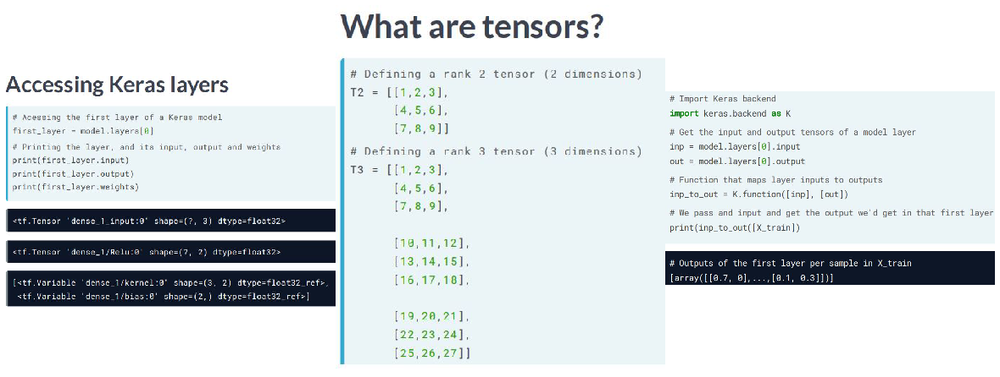

Time to introduce a new architecture...


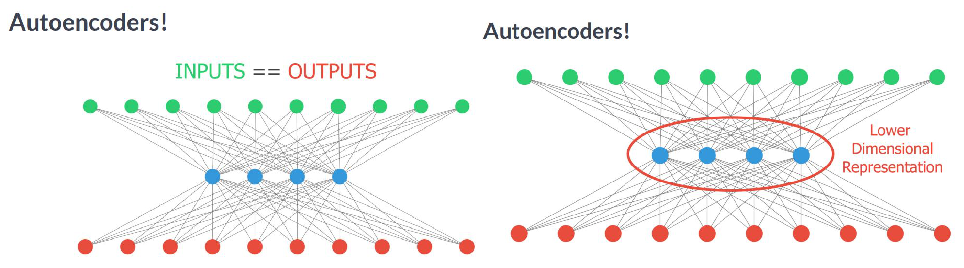

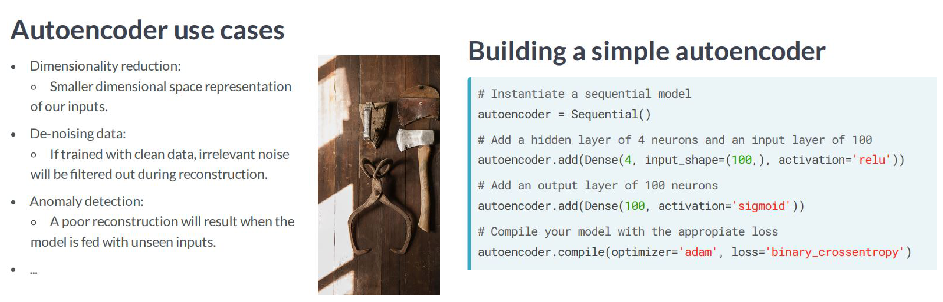

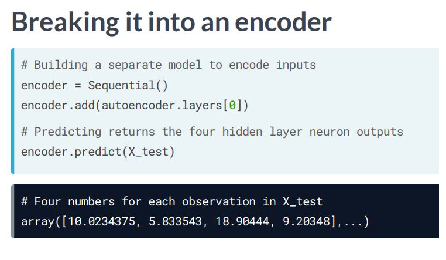

In [62]:
#vídeo
import keras.backend as K

plot_3('acc_keras', 'tensors', 'k_back'); print("="*120); print("""Time to introduce a new architecture...""")
plot_2('autoenc', 'autoenc2'); print("="*120); plot_2('auto_use', 'build_auto'); plot_1('break_auto')

Exercício 2

In [63]:
# It's a flow of tensors

# banknotes dataset
X = banknotes.drop('class', axis=1).values
y = banknotes['class'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

###################################

# Create a sequential model
model = Sequential()
model.add(Dense(2, input_shape=(4,), activation='sigmoid'))
model.add(Dense(1))
model.summary()

###################################

Model: "sequential_50"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_140 (Dense)            (None, 2)                 10        
_________________________________________________________________
dense_141 (Dense)            (None, 1)                 3         
Total params: 13
Trainable params: 13
Non-trainable params: 0
_________________________________________________________________


In [64]:
# Import keras backend
import keras.backend as K

# Input tensor from the 1st layer of the model
inp = model.layers[0].input

# Output tensor from the 1st layer of the model
out = model.layers[0].output

# Define a function from inputs to outputs
inp_to_out = K.function([inp], [out])

# Print the results of passing X_test through the 1st layer
print(inp_to_out([X_test]))

[array([[2.05922484e-01, 2.46557921e-01],
       [5.75782359e-02, 9.89941359e-01],
       [3.15356255e-03, 3.45344411e-08],
       [2.72871852e-02, 9.21805501e-01],
       [2.71582812e-01, 9.56321478e-01],
       [1.98427975e-01, 9.99825597e-01],
       [2.60192096e-01, 1.00000000e+00],
       [2.01602489e-01, 9.94013846e-01],
       [2.56172657e-01, 9.96716380e-01],
       [3.95627707e-01, 6.13164008e-02],
       [5.86453080e-03, 9.99972343e-01],
       [1.66118443e-02, 9.38482702e-01],
       [1.03278100e-01, 9.99977469e-01],
       [3.33836973e-02, 8.29161399e-06],
       [1.30668819e-01, 4.83870972e-05],
       [3.07765365e-01, 9.99997497e-01],
       [3.13025177e-01, 1.00000000e+00],
       [2.12652385e-02, 1.21455401e-01],
       [3.14713866e-01, 1.23637438e-01],
       [3.50013375e-03, 9.99342084e-01],
       [6.10304952e-01, 2.85139799e-01],
       [2.75369346e-01, 9.99999285e-01],
       [4.19632673e-01, 9.99969363e-01],
       [5.88214874e-01, 9.83738840e-01],
       [8.06569

Exercício 3

412/412 [==============================] - 0s 27us/step


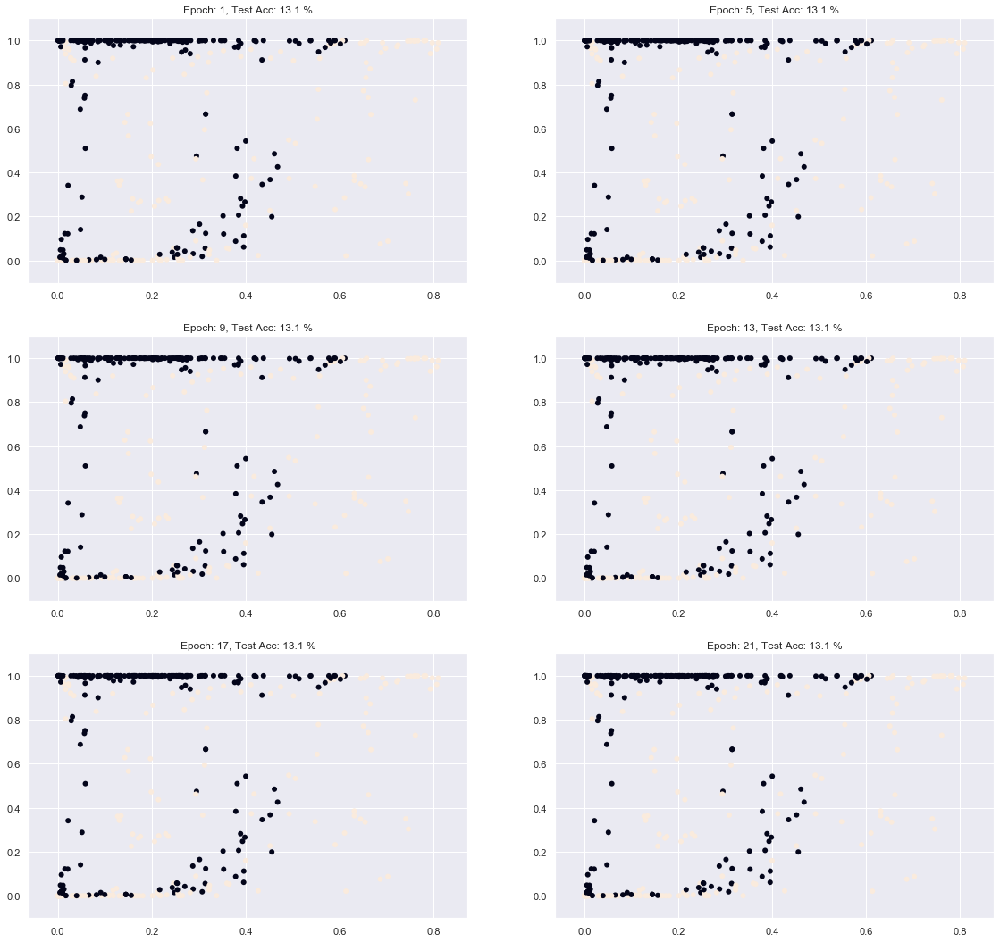

If you take a look at the graphs you can see how the neurons are learning to spread out the classes during 
training.


In [65]:
# Neural separation

model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['accuracy'])

# def plot():
#     fig, ax = plt.subplots()
#     plt.scatter(layer_output[:, 0], layer_output[:, 1],c=y_test,edgecolors='none')
#     plt.title('Epoch: {}, Test Acc: {:3.1f} %'.format(i+1, test_accuracy * 100.0))
#     plt.show()

j = 1    
for i in range(0, 21):
    # Train model for 1 epoch
    h = model.fit(X_train, y_train, batch_size=16, epochs=1,verbose=0)
    if i%4==0: 
        # Get the output of the first layer
        layer_output = inp_to_out([X_test])[0]
        
        # Evaluate model accuracy for this epoch
        test_accuracy = model.evaluate(X_test, y_test)[1] 
      
        # Plot 1st vs 2nd neuron output
        plt.subplot(3, 2, j)
        plt.scatter(layer_output[:, 0], layer_output[:, 1], c=y_test, edgecolors='none')
        plt.title('Epoch: {}, Test Acc: {:3.1f} %'.format(i+1, test_accuracy * 100.0))
        j = j + 1

plt.subplots_adjust(left=0, bottom=-2.5, right=2.5, top=1, wspace=0.2, hspace=0.2)
plt.show()

print("""If you take a look at the graphs you can see how the neurons are learning to spread out the classes during 
training.""")

Exercício 4

Autoencoders have several interesting applications like anomaly detection or image denoising. They aim at producing an output identical to its inputs. The input will be compressed into a lower dimensional space, encoded. The model then learns to decode it back to its original form.

You will encode and decode the MNIST dataset of handwritten digits, the hidden layer will encode a 32-dimensional representation of the image, which originally consists of 784 pixels.

In [66]:
# Building an autoencoder

# MNIST dataset 
digits_pixels = np.load(data_folder + 'digits_pixels.npy')
digits_target = np.load(data_folder + 'digits_target.npy')
digits_target = pd.get_dummies(digits_target)
X_train, X_test, y_train, y_test = train_test_split(digits_pixels, digits_target, test_size=0.3, random_state=1)

#################################################################

# Start with a sequential model
autoencoder = Sequential()

# Add a dense layer with the original image as input
autoencoder.add(Dense(32, input_shape=(784, ), activation="relu"))

# Add an output layer with as many nodes as the image
autoencoder.add(Dense(784, activation="sigmoid"))

# Compile your model
autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy')

# Take a look at your model structure
autoencoder.summary()

Model: "sequential_51"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_142 (Dense)            (None, 32)                25120     
_________________________________________________________________
dense_143 (Dense)            (None, 784)               25872     
Total params: 50,992
Trainable params: 50,992
Non-trainable params: 0
_________________________________________________________________


Exercício 5

In [67]:
%%script false
# De-noising like an autoencoder

def show_encodings(encoded_imgs, number=4):
    n = 5  # how many digits we will display
    original = X_test_noise
    original = original[np.where(y_test == number)]
    encoded_imgs = encoded_imgs[np.where(y_test==number)]
    plt.figure(figsize=(20, 4))
    #plt.title('Original '+str(number)+' vs Encoded representation')
    for i in range(min(n, len(original))):
        # display original imgs
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(original[i].reshape(28, 28))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # display encoded imgs
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(np.tile(encoded_imgs[i], (32,1)))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()
    
def compare_plot(original,decoded_imgs):
    n = 4  # How many digits we will display
    plt.figure(figsize=(20, 4))
    for i in range(n):
        # Display original
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(original[i].reshape(28, 28))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # Display reconstruction
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(decoded_imgs[i].reshape(28, 28))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.title('Noisy vs Decoded images')
    plt.show()


##############################################################################################

# vou assumir o noise como ...
X_test_noise = X_test.copy()[:100]

##############################################################################################

# Build your encoder
encoder = Sequential()
encoder.add(autoencoder.layers[0])

# Encode the images and show the encodings
preds = encoder.predict(X_test_noise)
show_encodings(preds)

# Predict on the noisy images with your autoencoder
decoded_imgs = autoencoder.predict(X_test_noise)

# Plot noisy vs decoded images
compare_plot(X_test_noise, decoded_imgs)

Couldn't find program: 'false'


#### Exercício 6 - Intro to CNNs

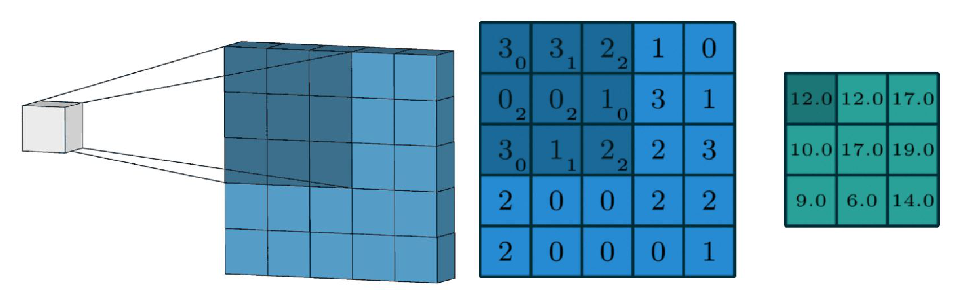

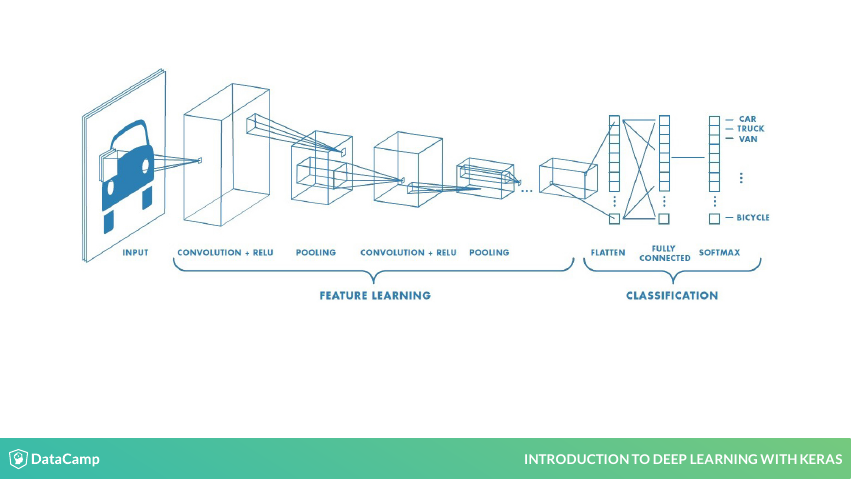

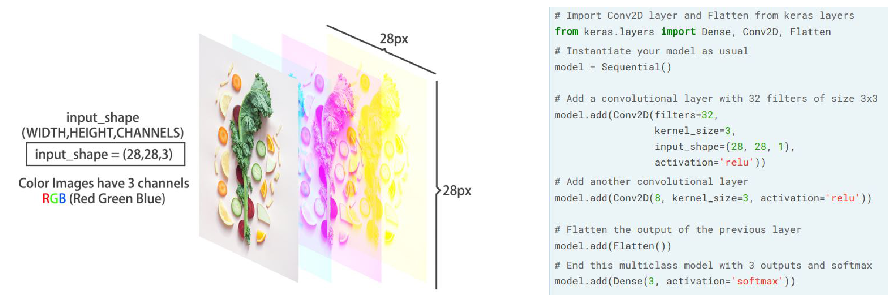

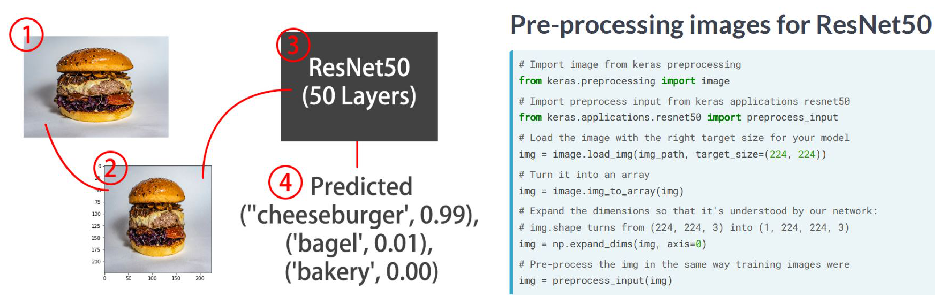

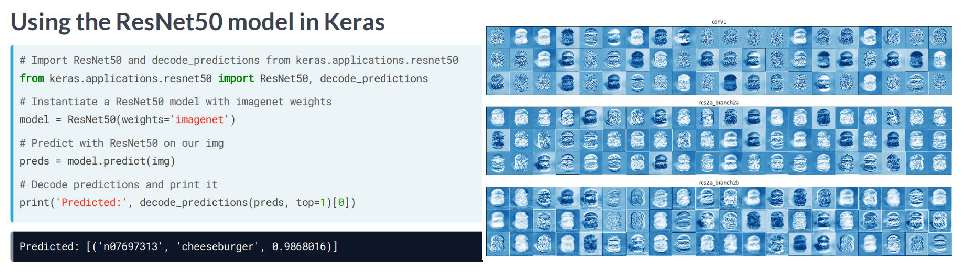

In [68]:
#vídeo
from keras.layers import Dense, Conv2D, Flatten
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input
from keras.applications.resnet50 import ResNet50, decode_predictions

plot_2('conv', 'conv2'); print("="*120); display(pdf_4[14]); plot_2('rgb', 'conv3'); print("="*120)
plot_2('1234', 'resnet'); plot_2('resnet2', 'conv_resnet')

Exercício 7

Building a CNN model in Keras isn't much more difficult than building any of the models you've already built throughout the course. You just need to make use of convolutional layers.

You're going to build a shallow convolutional model that classifies the MNIST dataset of digits. The same one you de-noised with your autoencoder. The images are 28x28 pixels and just have one channel.

In [69]:
# Building a CNN model

# Import the Conv2D and Flatten layers and instantiate model
from keras.layers import Conv2D, Flatten

model = Sequential()

# Add a convolutional layer of 32 filters of size 3x3
model.add(Conv2D(filters=32, input_shape=(28, 28, 1), kernel_size=3, activation='relu'))

# Add a convolutional layer of 16 filters of size 3x3
model.add(Conv2D(filters=16, kernel_size=3, activation='relu'))

# Flatten the previous layer output
model.add(Flatten())

# Add as many outputs as classes with softmax activation
model.add(Dense(10, activation='softmax'))

model.summary()

Model: "sequential_52"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 24, 24, 16)        4624      
_________________________________________________________________
flatten_1 (Flatten)          (None, 9216)              0         
_________________________________________________________________
dense_144 (Dense)            (None, 10)                92170     
Total params: 97,114
Trainable params: 97,114
Non-trainable params: 0
_________________________________________________________________


Exercício 8

Inspecting the activations of a convolutional layer is a cool thing. 

To do so, you will build a new model with the Keras Model object, which takes in a list of inputs and a list of outputs. The output you will provide to this new model is the first convolutional layer outputs when given an MNIST digit as input image.

The convolutional model you built in the previous exercise has already been trained for you. You can check it with model.summary() in the console.

Let's look at the convolutional masks that were learned in the first convolutional layer of this model

In [70]:
%%script false
# Looking at convolutions

from keras.engine.training import Model

# Obtain a reference to the outputs of the first layer
layer_output = model.layers[0].output

# Build a model using the model's input and the first layer output
first_layer_model = Model(inputs = model.input, outputs = layer_output)

# Use this model to predict on X_test
activations = first_layer_model.predict(X_test)

# Plot the activations of first digit of X_test for the 15th filter
axs[0].matshow(activations[0, :, :, 14], cmap = 'viridis')

# Do the same but for the 18th filter now
axs[1].matshow(activations[0, :, :, 19], cmap = 'viridis')
plt.show()


Couldn't find program: 'false'


Exercício 9

When using an already trained model like ResNet50, we need to make sure that we fit the network the way it was originally trained. So if we want to use a trained model on our custom images, these images need to have the same dimensions as the one used in the original model.

The original ResNet50 model was trained with images of size 224x224 pixels and a number of preprocessing operations; like the subtraction of the mean pixel value in the training set for all training images.

You will go over these preprocessing steps as you prepare this dog's (named Ivy) image into one that can be classified by ResNet50.

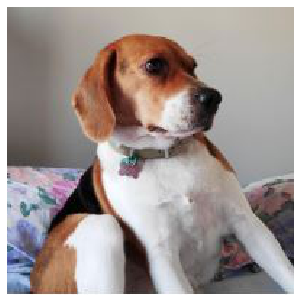

In [71]:
plot_1('ivy')

In [72]:
# Preparing your input image

# Import image and preprocess_input
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input

# Load the image with the right target size for your model
img = image.load_img(data_folder + "ivy.jpg", target_size=(224, 224))

# Turn it into an array
img_array = image.img_to_array(img)

# Expand the dimensions of the image
img_expanded = np.expand_dims(img_array, axis = 0)

# Pre-process the img in the same way original images were
img_ready = preprocess_input(img_expanded)

print("Ivy is now ready for ResNet50. Do you know this dog's breed? Let's see what this model thinks it is")

Ivy is now ready for ResNet50. Do you know this dog's breed? Let's see what this model thinks it is


Exercício 10

**ResNet50** is a model trained on the Imagenet dataset that is able to distinguish between 1000 different objects. ResNet50 is a deep model with 50 layers, you can check it in 3D here: https://tensorspace.org/html/playground/resnet50.html.

In [73]:
# Using a real world model

from keras.applications.resnet50 import ResNet50, decode_predictions

# Instantiate a ResNet50 model with 'imagenet' weights
model = ResNet50(weights='imagenet')

# Predict with ResNet50 on your already processed img
preds = model.predict(img_ready)

# Decode the first 3 predictions
print('\nPredicted:', decode_predictions(preds, top=3)[0])


Predicted: [('n02088364', 'beagle', 0.720474), ('n02089867', 'Walker_hound', 0.18295792), ('n02089973', 'English_foxhound', 0.092309624)]


#### Exercício 11 - Intro to LSTMs

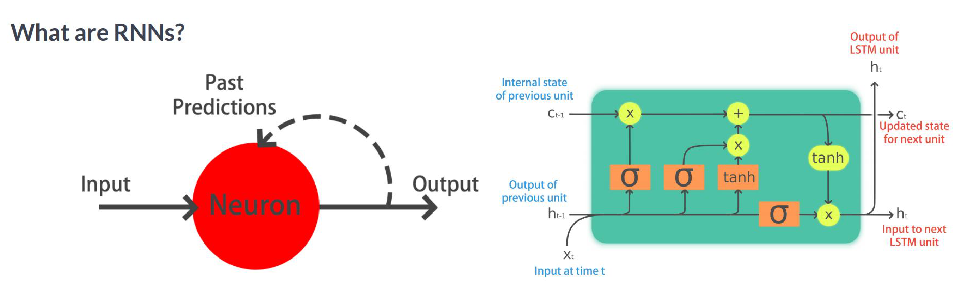

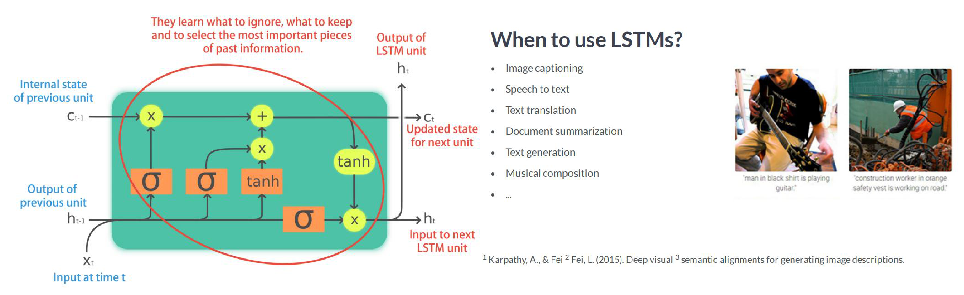

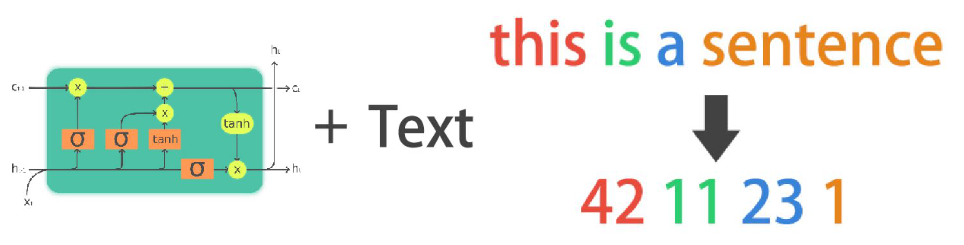

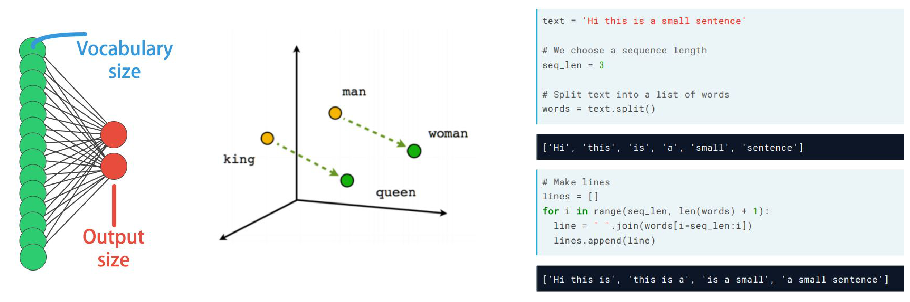

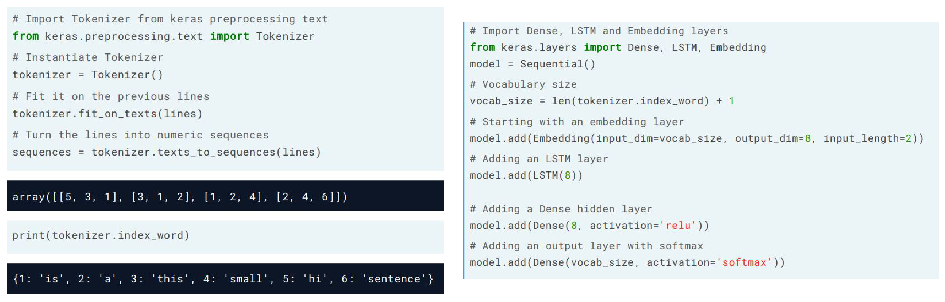

In [74]:
#vídeo
plot_2('rnn', 'rnn2'); plot_2('rnn3', 'rnn4'); print("="*120); plot_2('text', 'this'); plot_2('text2', 'text3')
print("="*120)

from keras.preprocessing.text import Tokenizer
from keras.layers import Dense, LSTM, Embedding

plot_2('text4', 'text5')

Exercício 12

During the following exercises you will build an LSTM model that is able to **predict the next word** using a small text dataset. This dataset consist of cleaned quotes from the The Lord of the Ring movies. You can find them in the text variable.

You will turn this text into sequences of length 4 and make use of the Keras Tokenizer to prepare the features and labels for your model!

The Keras Tokenizer assigns a unique number to each unique word, and stores the mappings in a dictionary. This is important since the model deals with numbers but we later will want to decode the output numbers back into words.

In [75]:
# Text prediction with LSTMs

text = """it is not the strength of the body but the strength of the spirit it is useless to meet revenge with revenge it 
will heal nothing even the smallest person can change the course of history all we have to decide is what to do with the 
time that is given us the burned hand teaches best after that advice about fire goes to the heart."""

from keras.preprocessing.text import Tokenizer

# Split text into an array of words 
words = text.split()

# Make lines of 4 words each, moving one word at a time
lines = []
for i in range(4, len(words)):
    lines.append(' '.join(words[i-4:i]))

# Instantiate a Tokenizer, then fit it on the lines
tokenizer = Tokenizer()
tokenizer.fit_on_texts(lines)

# Turn lines into a sequence of numbers
sequences = tokenizer.texts_to_sequences(lines)
print("Lines: \n {} \n\n Sequences: \n {}".format(lines[:5],sequences[:5]))


Lines: 
 ['it is not the', 'is not the strength', 'not the strength of', 'the strength of the', 'strength of the body'] 

 Sequences: 
 [[5, 2, 42, 1], [2, 42, 1, 6], [42, 1, 6, 4], [1, 6, 4, 1], [6, 4, 1, 10]]


In [76]:
print(tokenizer.index_word)

{1: 'the', 2: 'is', 3: 'to', 4: 'of', 5: 'it', 6: 'strength', 7: 'revenge', 8: 'with', 9: 'that', 10: 'body', 11: 'but', 12: 'spirit', 13: 'useless', 14: 'meet', 15: 'will', 16: 'heal', 17: 'nothing', 18: 'even', 19: 'smallest', 20: 'person', 21: 'can', 22: 'change', 23: 'course', 24: 'history', 25: 'all', 26: 'we', 27: 'have', 28: 'decide', 29: 'what', 30: 'do', 31: 'time', 32: 'given', 33: 'us', 34: 'burned', 35: 'hand', 36: 'teaches', 37: 'best', 38: 'after', 39: 'advice', 40: 'about', 41: 'fire', 42: 'not', 43: 'goes'}


Exercício 13

In [77]:
# Build your LSTM model

vocab_size = len(tokenizer.index_word) + 1    # 44

# Import the Embedding, LSTM and Dense layer
from keras.layers import Dense, LSTM, Embedding

model = Sequential()

# Add an Embedding layer with the right parameters
model.add(Embedding(input_dim=vocab_size, output_dim=8, input_length=3))

# Add a 32 unit LSTM layer
model.add(LSTM(32))

# Add a hidden Dense layer of 32 units and an output layer of vocab_size with softmax
model.add(Dense(32, activation='relu'))
model.add(Dense(vocab_size, activation='softmax'))
model.summary()

print("""\nYou'll see that this model is powerful enough to learn text relationships. Specially because we aren't using a
lot of text in this tiny example.""")

Model: "sequential_53"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 3, 8)              352       
_________________________________________________________________
lstm_1 (LSTM)                (None, 32)                5248      
_________________________________________________________________
dense_145 (Dense)            (None, 32)                1056      
_________________________________________________________________
dense_146 (Dense)            (None, 44)                1452      
Total params: 8,108
Trainable params: 8,108
Non-trainable params: 0
_________________________________________________________________

You'll see that this model is powerful enough to learn text relationships. Specially because we aren't using a
lot of text in this tiny example.


Exercício 14

Your LSTM model has already been trained for you so that you don't have to wait. It's time to define a function that decodes its predictions.

Since you are predicting on a model that uses the softmax function,argmax() can be used to obtain the index/position representing the most probable next word out of the output vector of probabilities.

The tokenizer you previously created and fitted, is loaded for you. You will be making use of its internal index_word dictionary to turn the model's next word prediction (which is an integer) into the actual written word it represents.

In [78]:
# Decode your predictions

def predict_text(test_text):
    if len(test_text.split()) != 3:
        print('Text input should be 3 words!')
        return False
  
    # Turn the test_text into a sequence of numbers
    test_seq = tokenizer.texts_to_sequences([test_text])
    test_seq = np.array(test_seq)
  
    # Get the model's next word prediction by passing in test_seq
    pred = model.predict(test_seq).argmax(axis = 1)[0]
  
    # Return the word associated to the predicted index
    return tokenizer.index_word[pred]


Exercício 15

Try out these strings on your LSTM model:

- 'meet revenge with'
- 'the course of'
- 'strength of the'

Which sentence could be made with the word output from the sentences above?

In [79]:
# Test your model

print(predict_text('meet revenge with'))
print(predict_text('the course of'))
print(predict_text('strength of the'))

# supostamente seria "Revenge is your history and spirit"

the
spirit
strength


#### Exercício 16 - end

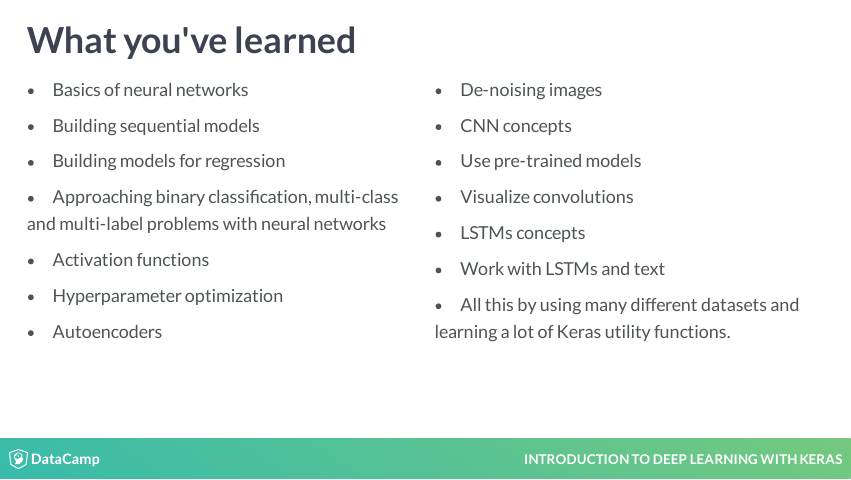

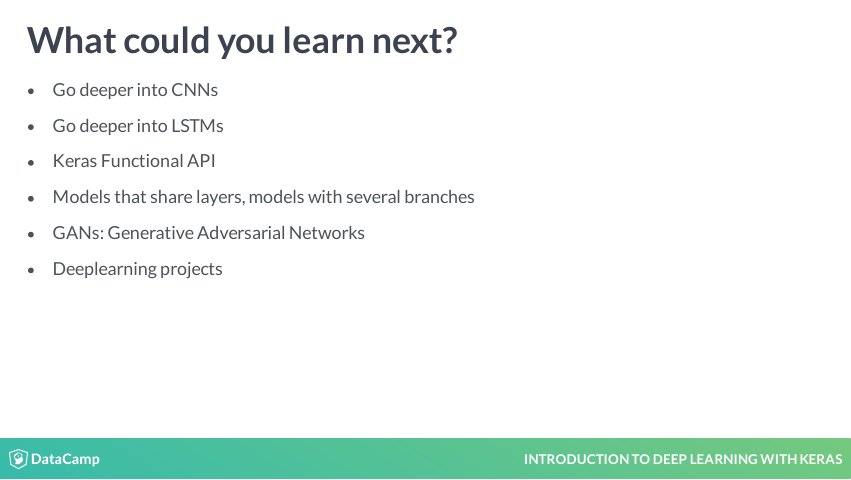

In [80]:
#vídeo
display(pdf_4[37])
display(pdf_4[38])

# Fim

In [81]:
end_time = time.time()
total_time = end_time - start_time
print("""Time to run: {} minutes""".format(round(total_time/60, 1)))

Time to run: 4.4 minutes
